In [ ]:
!pip install --quiet google-cloud-bigquery pandas-gbq


Autentícate con tu cuenta de Google

In [ ]:
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


In [ ]:
import os
from google.cloud import bigquery

# Ruta al archivo JSON
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/vtpv-ecosystem-exp.json"

# Crear el cliente de BigQuery
client = bigquery.Client()


Convocamos los df

In [ ]:
import os
from google.cloud import bigquery

os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/vtpv-ecosystem-exp.json"
client = bigquery.Client()




In [ ]:
# Crear el cliente
client = bigquery.Client()

# Definir proyecto y dataset
project_id = "vtpv-ecosystem-exp"
dataset_id = "ft_master_data_raw"

# Obtener la referencia del dataset
dataset_ref = bigquery.DatasetReference(project_id, dataset_id)

# Listar tablas del dataset
tables = client.list_tables(dataset_ref)

# Mostrar nombres de las tablas
for table in tables:
    print(f"📦 {table.table_id}")

📦 dim_codigo_lab
📦 tb_agrupadores
📦 tb_formulado_consolidado_2024_2025
📦 tb_formulated_2022_2023
📦 tb_ingredient_2022_2023
📦 tb_palatabilidad_main
📦 tb_productive_indicator_TRX_2022_2025
📦 tb_productive_indicator_TUM_2022_2025
📦 tb_productive_indicator_UCSUR_2021_2025
📦 tb_real_results_2017_2023
📦 tb_water_data_2017_23


In [ ]:
job = client.query("""
    SELECT *
    FROM `vtpv-ecosystem-exp.ft_master_data_raw.tb_productive_indicator_TRX_2022_2025`
""")

df_trx = job.result().to_dataframe(create_bqstorage_client=False)




In [ ]:
# TUM
df_tum = client.query("""
    SELECT *, 'TUM' AS origen
    FROM `vtpv-ecosystem-exp.ft_master_data_raw.tb_productive_indicator_TUM_2022_2025`
""").result().to_dataframe(create_bqstorage_client=False)

# UCSUR
df_ucs = client.query("""
    SELECT *, 'UCSUR' AS origen
    FROM `vtpv-ecosystem-exp.ft_master_data_raw.tb_productive_indicator_UCSUR_2021_2025`
""").result().to_dataframe(create_bqstorage_client=False)


Concatenando df

In [ ]:
import pandas as pd

df_productivo = pd.concat([df_trx, df_tum, df_ucs], ignore_index=True)


Explorando el df_consolidado

In [ ]:
df_productivo.info()
df_productivo.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196891 entries, 0 to 196890
Columns: 108 entries, ITA to origen
dtypes: Float64(1), datetime64[us, UTC](2), float64(95), object(10)
memory usage: 162.4+ MB


,ITA,Tanque,Dia,Fecha,Cosecha_Numero_,Cosecha_kg_,Numerodemuertos,Pesodemuestreo_g_,AlimentoReal_kg_,TA_porcentaje_,...,MuertoAcumulado,BiomasaMuertos,BiomasaMuertoAcu,RaleoAcumuladoMasMuerto,Sobrevivenciacorregida2,CamaronMenosRaleo,Sobrevivenciacorregida3,GCD_corregido,CEA,origen
0,ITA-TXO-2022-01,1,0.0,2022-01-04 00:00:00+00:00,None,NaN,NaN,18.433333,0.0,1.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Trujillo,NaN
1,ITA-TXO-2022-01,2,0.0,2022-01-04 00:00:00+00:00,None,NaN,NaN,18.516667,0.0,1.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Trujillo,NaN
2,ITA-TXO-2022-01,3,0.0,2022-01-04 00:00:00+00:00,None,NaN,NaN,15.041667,0.0,1.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Trujillo,NaN
3,ITA-TXO-2022-01,4,0.0,2022-01-04 00:00:00+00:00,None,NaN,NaN,14.783333,0.0,1.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Trujillo,NaN
4,ITA-TXO-2022-01,5,0.0,2022-01-04 00:00:00+00:00,None,NaN,NaN,14.950000,0.0,1.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Trujillo,NaN


In [ ]:
# Reemplaza df_productivo si tu DataFrame tiene otro nombre
df = df_productivo.copy()

# Contar ceros por columna
ceros = (df == 0).sum()

resumen_columnas = pd.DataFrame({
    "Columna": df.columns,
    "Tipo de dato": df.dtypes.astype(str),
    "Total de filas": len(df),
    "Valores nulos (NaN)": df.isnull().sum().values,
    "% de nulos": (df.isnull().mean().values * 100).round(2),
    "Filas con valor 0": ceros.values
})

# Mostrar todos los rows sin truncar
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Mostrar resumen completo
resumen_columnas



,Columna,Tipo de dato,Total de filas,Valores nulos (NaN),% de nulos,Filas con valor 0
ITA,ITA,object,196891,0,0.00,0
Tanque,Tanque,object,196891,2371,1.20,0
Dia,Dia,Float64,196891,2565,1.30,4470
Fecha,Fecha,"datetime64[us, UTC]",196891,2565,1.30,0
Cosecha_Numero_,Cosecha_Numero_,object,196891,191446,97.23,0
Cosecha_kg_,Cosecha_kg_,float64,196891,68632,34.86,122378
Numerodemuertos,Numerodemuertos,float64,196891,70893,36.01,123864
Pesodemuestreo_g_,Pesodemuestreo_g_,float64,196891,0,0.00,169474
AlimentoReal_kg_,AlimentoReal_kg_,float64,196891,20463,10.39,759
TA_porcentaje_,TA_porcentaje_,float64,196891,6668,3.39,746


In [ ]:
# Crear nuevo DataFrame filtrado
df_filtrado = df_productivo[df_productivo["Pesodemuestreo_g_"] != 0].copy()

#filtrando todas las filas que sean igual a 0 o NA

##df_filtrado

In [ ]:
# Crear resumen de df_filtrado
df = df_filtrado.copy()
ceros = (df == 0).sum()

resumen_columnas = pd.DataFrame({
    "Columna": df.columns,
    "Tipo de dato": df.dtypes.astype(str),
    "Total de filas": len(df),
    "Valores nulos (NaN)": df.isnull().sum().values,
    "% de nulos": (df.isnull().mean().values * 100).round(2),
    "Filas con valor 0": ceros.values
})

# Exportar resumen
resumen_columnas.to_excel("resumen_columnas_df_productivo.xlsx", index=False)
from google.colab import files
files.download("resumen_columnas_df_productivo.xlsx")

# 💡 Convertir columnas datetime con zona horaria a naive
df_sin_tz = df.copy()
for col in df_sin_tz.select_dtypes(include=["datetimetz"]).columns:
    df_sin_tz[col] = df_sin_tz[col].dt.tz_localize(None)

# Exportar DataFrame filtrado sin ceros
df_sin_tz.to_excel("df_filtrado_sin_ceros.xlsx", index=False)
files.download("df_filtrado_sin_ceros.xlsx")



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Solo columnas numéricas
rango_columnas = df_filtrado.select_dtypes(include='number').agg(['min', 'max'])
rango_columnas.loc['rango'] = rango_columnas.loc['max'] - rango_columnas.loc['min']

# Transponer para que se vea mejor
rango_columnas = rango_columnas.T
rango_columnas.reset_index(inplace=True)
rango_columnas.rename(columns={'index': 'Columna'}, inplace=True)

rango_columnas


,Columna,min,max,rango
0,Dia,0.000000,45117.000000,45117.000000
1,Cosecha_kg_,0.000000,1682.800002,1682.800002
2,Numerodemuertos,0.000000,2704.400000,2704.400000
3,Pesodemuestreo_g_,0.003606,3206.900000,3206.896394
4,AlimentoReal_kg_,0.000000,527.800000,527.800000
5,TA_porcentaje_,0.000000,6.640000,6.640000
6,TC_porcentaje_,0.000000,100.000000,100.000000
7,Sobrev,3.130000,113.333333,110.203333
8,PesoCamaronReal_g_,0.000000,41.740000,41.740000
9,PesoCamaronTeorico_g_,0.000000,41.839084,41.839084


In [ ]:
df_filtrado_validado = df_filtrado[
    (df_filtrado["Pesodemuestreo_g_"] >= 0) & (df_filtrado["Pesodemuestreo_g_"] <= 32) &
    (df_filtrado["Dia"] >= 0) & (df_filtrado["Dia"] <= 120)
].copy()

# Mostrar resumen
df_filtrado_validado[["Pesodemuestreo_g_", "Dia"]].describe()

##df_filtrado_validado filtrando las filas de peso muestreo correctas (entre 0 a 32)

,Pesodemuestreo_g_,Dia
count,27134.000000,27134.0
mean,11.945752,27.299698
std,8.944692,23.282305
min,0.003606,0.0
25%,3.869250,7.0
50%,10.260000,21.0
75%,19.311875,42.0
max,32.000000,111.0


In [ ]:
# Mostrar resumen
df_filtrado_validado.describe()



,Dia,Cosecha_kg_,Numerodemuertos,Pesodemuestreo_g_,AlimentoReal_kg_,TA_porcentaje_,TC_porcentaje_,Sobrev,PesoCamaronReal_g_,PesoCamaronTeorico_g_,PesoCamaronProyectado_g_,PesoRealCorregido_g_,AlimentoTeorico_kg_,Biomasa_kg_,Biomasa_kg_ha_,T_am,O2_am,pH_am,T_pm,O2_pm,pH_pm,Trans,Sal,ReK_sem,ALC,NH3_N,NH4_N,NAT,NO2,AT,CIANO,CLORO,DIATO,EUGLENO,PYRRO,CIANO_porcentaje,Semana,CAsem,GPsem,GPsemTeorico,GPsemProyectado,AlimentoReal_g_,SGR_Mod,SGR_Real,dif_SGR_abs,diff_SGR_porc,Desv_PesoReal,Diff_PesoReal,desv_gp_sem,diff_gp_sem,BodyWeight,Weekly_BW,ratio_ab,GPacu,IC,BIOMfin_g_,BIOMganadsemanal_g_,BIOMganadacum_g_,BIOMKg_ha,FCAsem,FCAacu,ConsumoAlimento_g_cam_dia_,CAprom_g_cam_dia_,PrecioCamaron,Precioalimento,Alimento_kg_ha_,CostoAlimento_dolar_ha_,CostoTotal,Ingreso,IngresosNetos,UP_dolar_Ha_dia_,Lbs_Ha,Costo_Lb,ROI,cv_peso,cv_gpacum,cv_ic,cv_fca,cv_sob,cv_cagcd,cv_caacum,gcd_teorico,Pesoganadopostransferencia,raleo_acumulado_gr,BiomasaGanadaMasRaleo,fca_acu_corregido,sumadecamraleo_cosecha,AnimalRaleadoAcumulado,MuertoAcumulado,BiomasaMuertos,BiomasaMuertoAcu,RaleoAcumuladoMasMuerto,Sobrevivenciacorregida2,CamaronMenosRaleo,Sobrevivenciacorregida3,GCD_corregido
count,27134.0,19215.000000,18397.000000,27134.000000,23207.000000,27128.000000,27134.000000,27126.000000,27134.000000,27134.000000,27134.000000,27118.000000,23507.000000,27134.000000,9800.000000,13122.000000,12168.000000,12910.000000,9800.000000,9272.000000,9361.000000,14900.000000,1557.000000,27134.000000,3235.000000,1370.000000,3134.000000,3157.000000,3219.000000,1101.000000,650.000000,680.000000,877.000000,1.0,144.000000,0.0,22858.000000,22766.000000,22749.000000,22765.000000,22766.000000,27134.000000,16664.000000,16648.000000,16665.000000,16648.000000,16657.000000,16657.000000,16648.000000,16648.000000,19634.000000,16649.000000,20089.000000,22842.000000,22842.000000,27082.000000,22731.000000,22824.000000,27066.000000,22731.000000,22823.000000,19635.000000,21748.000000,27134.000000,27106.000000,27096.000000,27096.000000,27096.000000,27084.000000,27059.000000,22805.000000,27066.000000,27066.000000,10203.000000,26942.000000,22553.000000,21882.000000,22430.000000,26849.000000,21357.000000,25793.000000,21541.000000,0.0,11186.000000,9872.000000,10143.000000,6799.000000,10994.000000,10994.000000,11186.000000,10994.000000,10994.000000,739.000000,10994.000000,10994.000000,744.000000
mean,27.299698,0.209517,0.177257,11.945752,0.033727,1.131005,1.141613,92.089934,11.943682,12.135850,12.540213,11.934994,0.039240,0.867583,5706.648967,29.384366,5.853480,8.035082,31.283030,5.784579,8.145950,61.467181,18.600193,0.381072,148.358887,0.194353,1.387275,1.493223,7.317935,77471.298819,27823.846154,28021.323529,48295.895097,1500.0,6302.083333,NaN,4.647213,288.471240,2.040186,2.266200,2.301557,28.846112,5.531128,4.817091,1.440142,92.364826,96.581284,-0.245880,92.552421,-0.245859,5.653162,5.876196,92.342002,9.635544,1.914661,914.200494,136.429002,726.543071,5503.272673,0.850010,1.523296,0.437465,0.436467,1.636947,0.319915,5830.089986,1902.121107,3026.494566,12692.421360,9676.339168,348.155022,12132.624999,1.989850,2.082474,4.553633,7.095503,11.196106,8.425935,0.674201,2.659850,3.052744,0.382968,NaN,0.358445,923.900846,1.305841,11.439758,22.234582,0.288042,0.320200,1.831720,22.400582,55.139689,103.121066,99.652428,0.409418
std,23.282305,0.491833,1.965911,8.944692,0.022786,0.127231,0.825593,14.743907,8.946477,9.124077,9.219799,8.937264,0.023422,0.735212,3279.830731,2.040139,0.441886,0.229123,2.240269,0.425062,0.227813,22.352479,11.808178,2.670216,26.390275,0.092865,1.062399,1.145814,9.992224,87150.071184,47744.683719,45596.808026,67277.427443,NaN,7596.055921,NaN,3.134940,169.763059,1.102364,0.824655,0.726139,24.184131,6.991219,5.870105,2.440911,70.673459,15.337534,0.890233,72.098481,0.888565,7.750356,6.568832,16.660845,7.656582,0.774947,698.314055,195.913025,598.682245,3642.991787,129.962068,12.107688,0.184134,0.192608,1.244197,0.482917,5826.124207,4327.284575,5639.403787,12032.008798,11611.427889,

In [ ]:
# Mostrar resumen
df_filtrado_validado[['ROI']].describe()

,ROI
count,10203.000000
mean,2.082474
std,5.651636
min,-1.000000
25%,-1.000000
50%,0.347169
75%,1.042024
max,34.542836


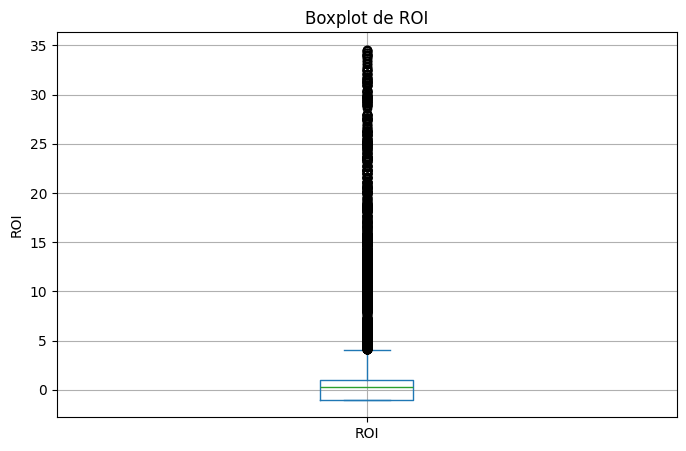

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Crear boxplot de la columna ROI
plt.figure(figsize=(8, 5))
df_filtrado_validado['ROI'].plot(kind='box')
plt.title('Boxplot de ROI')
plt.ylabel('ROI')
plt.grid(True)
plt.show()


In [ ]:
# Asegurar que ambas columnas sean string: Tratamiento y Dieta en df_filtrado_validado
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].astype(str)
df_filtrado_validado["Tratamiento"] = df_filtrado_validado["Tratamiento"].astype(str)

# Reemplazar los valores "0" en Dieta con el valor de Tratamiento
df_filtrado_validado.loc[df_filtrado_validado["Dieta"] == "0", "Dieta"] = \
    df_filtrado_validado.loc[df_filtrado_validado["Dieta"] == "0", "Tratamiento"]


In [ ]:
valores_dieta = df_filtrado_validado["Dieta"].dropna().unique()
valores_dieta = sorted(valores_dieta)
valores_dieta


[' T5-481883',
 ' T6-481879',
 '(T1) T01-451858',
 '(T1)-451881-Normoxia',
 '(T2) T02-451860',
 '(T2)-451882-Normoxia',
 '(T3) T03-451859',
 '(T3)-451883-Normoxia',
 '(T4) T04-481933',
 '(T4)-451884-Normoxia',
 '0',
 '00:00:00',
 '1072',
 '1153',
 '1183',
 '1216',
 '1219',
 '1233',
 '1235',
 '1237',
 '1272',
 '1274',
 '1275',
 '1279',
 '1282',
 '1284',
 '1285',
 '1294',
 '1294/1298',
 '1298',
 '1298/1254',
 '1298/1365',
 '1306/1305',
 '1316',
 '1327/1287',
 '1364',
 '1364.0',
 '1372',
 '1373',
 '1381',
 '1390',
 '1397',
 '1400',
 '1576',
 '1599',
 '1603',
 '1604',
 '1605',
 '451558',
 '451559',
 '451589',
 '451589.0',
 '451650',
 '451651/451650',
 '451651/481701',
 '451652/481701',
 '451653/481701',
 '451654/481701',
 '481412',
 '481415',
 '481416',
 '481431',
 '481491',
 '481492',
 '481493',
 '481494',
 '481543',
 '481544',
 '481545',
 '481546',
 '481578',
 '481579',
 '481580',
 '481582',
 '481585',
 '481587',
 '481588',
 '481589',
 '481589.0',
 '481590',
 '481590.0',
 '481592',
 '481

In [ ]:
# Asegurar que sea tipo string
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].astype(str)

# Limpiar espacios y prefijos tipo T1-, T10-, etc.
df_filtrado_validado["Dieta"] = (
    df_filtrado_validado["Dieta"]
    .str.strip()
    .str.replace(r"^T\d{1,2}-\s*", "", regex=True)
)

# Quitar cualquier aparición de "-Oms", con o sin espacios alrededor
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.replace(r"-\s*Oms", "", regex=True).str.strip()

# Quitar cualquier aparición de "-N", con o sin espacios alrededor
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.replace(r"-\s*N", "", regex=True).str.strip()

# Quitar cualquier aparición de "-Mst", con o sin espacios alrededor
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.replace(r"-\s*Mst", "", regex=True).str.strip()

# Quitar cualquier aparición de "-120porcentaje", con o sin espacios alrededor
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.replace(r"-\s*120porcentaje", "", regex=True).str.strip()

# Quitar cualquier aparición de "ormoxia", con o sin espacios alrededor
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.replace(r"ormoxia", "", regex=True).str.strip()


# Quitar cualquier aparición de "BP-", con o sin espacios alrededor
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.replace(r"BP-", "", regex=True).str.strip()

# Eliminar todos los espacios (internos, iniciales y finales)
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.replace(" ", "")


# Eliminar cualquier texto del tipo (###porcentaje)
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.replace(r"\(\d{3}porcentaje\)", "", regex=True).str.strip()

# Quitar cualquier aparición de "-Hipox", con o sin espacios alrededor
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.replace(r"-Hipox", "", regex=True).str.strip()

# Quitar cualquier aparición de "Manual", con o sin espacios alrededor
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.replace(r"Manual", "", regex=True).str.strip()

# Quitar cualquier aparición de "AA", con o sin espacios alrededor
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.replace(r"AA", "", regex=True).str.strip()

# Extraer solo el número final (asumiendo que son los últimos 6 dígitos)
df_filtrado_validado["Dieta"] = df_filtrado_validado["Dieta"].str.extract(r"(\d{6})")

#sorted(df_filtrado_validado["Dieta"].unique())

#df_filtrado_validado

In [ ]:
df_filtrado_validado.describe()

,Dia,Cosecha_kg_,Numerodemuertos,Pesodemuestreo_g_,AlimentoReal_kg_,TA_porcentaje_,TC_porcentaje_,Sobrev,PesoCamaronReal_g_,PesoCamaronTeorico_g_,PesoCamaronProyectado_g_,PesoRealCorregido_g_,AlimentoTeorico_kg_,Biomasa_kg_,Biomasa_kg_ha_,T_am,O2_am,pH_am,T_pm,O2_pm,pH_pm,Trans,Sal,ReK_sem,ALC,NH3_N,NH4_N,NAT,NO2,AT,CIANO,CLORO,DIATO,EUGLENO,PYRRO,CIANO_porcentaje,Semana,CAsem,GPsem,GPsemTeorico,GPsemProyectado,AlimentoReal_g_,SGR_Mod,SGR_Real,dif_SGR_abs,diff_SGR_porc,Desv_PesoReal,Diff_PesoReal,desv_gp_sem,diff_gp_sem,BodyWeight,Weekly_BW,ratio_ab,GPacu,IC,BIOMfin_g_,BIOMganadsemanal_g_,BIOMganadacum_g_,BIOMKg_ha,FCAsem,FCAacu,ConsumoAlimento_g_cam_dia_,CAprom_g_cam_dia_,PrecioCamaron,Precioalimento,Alimento_kg_ha_,CostoAlimento_dolar_ha_,CostoTotal,Ingreso,IngresosNetos,UP_dolar_Ha_dia_,Lbs_Ha,Costo_Lb,ROI,cv_peso,cv_gpacum,cv_ic,cv_fca,cv_sob,cv_cagcd,cv_caacum,gcd_teorico,Pesoganadopostransferencia,raleo_acumulado_gr,BiomasaGanadaMasRaleo,fca_acu_corregido,sumadecamraleo_cosecha,AnimalRaleadoAcumulado,MuertoAcumulado,BiomasaMuertos,BiomasaMuertoAcu,RaleoAcumuladoMasMuerto,Sobrevivenciacorregida2,CamaronMenosRaleo,Sobrevivenciacorregida3,GCD_corregido
count,27134.0,19215.000000,18397.000000,27134.000000,23207.000000,27128.000000,27134.000000,27126.000000,27134.000000,27134.000000,27134.000000,27118.000000,23507.000000,27134.000000,9800.000000,13122.000000,12168.000000,12910.000000,9800.000000,9272.000000,9361.000000,14900.000000,1557.000000,27134.000000,3235.000000,1370.000000,3134.000000,3157.000000,3219.000000,1101.000000,650.000000,680.000000,877.000000,1.0,144.000000,0.0,22858.000000,22766.000000,22749.000000,22765.000000,22766.000000,27134.000000,16664.000000,16648.000000,16665.000000,16648.000000,16657.000000,16657.000000,16648.000000,16648.000000,19634.000000,16649.000000,20089.000000,22842.000000,22842.000000,27082.000000,22731.000000,22824.000000,27066.000000,22731.000000,22823.000000,19635.000000,21748.000000,27134.000000,27106.000000,27096.000000,27096.000000,27096.000000,27084.000000,27059.000000,22805.000000,27066.000000,27066.000000,10203.000000,26942.000000,22553.000000,21882.000000,22430.000000,26849.000000,21357.000000,25793.000000,21541.000000,0.0,11186.000000,9872.000000,10143.000000,6799.000000,10994.000000,10994.000000,11186.000000,10994.000000,10994.000000,739.000000,10994.000000,10994.000000,744.000000
mean,27.299698,0.209517,0.177257,11.945752,0.033727,1.131005,1.141613,92.089934,11.943682,12.135850,12.540213,11.934994,0.039240,0.867583,5706.648967,29.384366,5.853480,8.035082,31.283030,5.784579,8.145950,61.467181,18.600193,0.381072,148.358887,0.194353,1.387275,1.493223,7.317935,77471.298819,27823.846154,28021.323529,48295.895097,1500.0,6302.083333,NaN,4.647213,288.471240,2.040186,2.266200,2.301557,28.846112,5.531128,4.817091,1.440142,92.364826,96.581284,-0.245880,92.552421,-0.245859,5.653162,5.876196,92.342002,9.635544,1.914661,914.200494,136.429002,726.543071,5503.272673,0.850010,1.523296,0.437465,0.436467,1.636947,0.319915,5830.089986,1902.121107,3026.494566,12692.421360,9676.339168,348.155022,12132.624999,1.989850,2.082474,4.553633,7.095503,11.196106,8.425935,0.674201,2.659850,3.052744,0.382968,NaN,0.358445,923.900846,1.305841,11.439758,22.234582,0.288042,0.320200,1.831720,22.400582,55.139689,103.121066,99.652428,0.409418
std,23.282305,0.491833,1.965911,8.944692,0.022786,0.127231,0.825593,14.743907,8.946477,9.124077,9.219799,8.937264,0.023422,0.735212,3279.830731,2.040139,0.441886,0.229123,2.240269,0.425062,0.227813,22.352479,11.808178,2.670216,26.390275,0.092865,1.062399,1.145814,9.992224,87150.071184,47744.683719,45596.808026,67277.427443,NaN,7596.055921,NaN,3.134940,169.763059,1.102364,0.824655,0.726139,24.184131,6.991219,5.870105,2.440911,70.673459,15.337534,0.890233,72.098481,0.888565,7.750356,6.568832,16.660845,7.656582,0.774947,698.314055,195.913025,598.682245,3642.991787,129.962068,12.107688,0.184134,0.192608,1.244197,0.482917,5826.124207,4327.284575,5639.403787,12032.008798,11611.427889,

In [ ]:
df_filtrado_validado = df_filtrado_validado.rename(columns={"Dieta": "codigo"})


In [ ]:
# cod
df_cod = client.query("""
    SELECT *
    FROM `vtpv-ecosystem-exp.ft_master_data_raw.dim_codigo_lab`
""").result().to_dataframe(create_bqstorage_client=False)

In [ ]:
df_cod

,codigo,docosahexaenoico_dha,fecha_de_ingreso,proceso,empresa,producto,aniomes,fecha_de_vencimiento,ph,coccion,aw,humedad,proteina_dumas,ceniza,fibra,calcio,fosforo,energia_kcal_kg,arg,gly,his,ile,asp,leu,lys,met,thr,val,phe,tyr,pro,glu,ser,ala,almidon,fosfolipidos,grasa,colesterol_mg_100g,magnesio,sodio,potasio,zinc_mg_kg,cobre_mg_kg,silicio_mg_kg,selenio_mg_kg,eicosapentaenoico_epa,fecha_de_producci_x0,cliente,tipo_de_entrega,nombre_asesor_tecnic
0,0210200101,NaN,None,None,None,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.090000,0.790000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.230000,NaN,NaN,0.210000,0.230000,1.280000,NaN,NaN,NaN,NaN,NaN,None,None,None,None
1,0210200201,NaN,None,None,None,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.920000,0.700000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.600000,NaN,NaN,0.230000,0.900000,1.400000,NaN,NaN,NaN,NaN,NaN,None,None,None,None
2,030622,NaN,2022-06-03 00:00:00,None,None,None,NaN,None,NaN,NaN,NaN,9.010000,37.300000,11.890000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.450000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None
3,040622,NaN,2022-06-04 00:00:00,None,None,None,NaN,None,NaN,NaN,NaN,9.100000,36.877000,12.020000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.720878,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None
4,0711200101,NaN,None,None,None,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.940000,0.830000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.640000,NaN,NaN,0.190000,0.170000,1.080000,NaN,NaN,NaN,NaN,NaN,None,None,None,None
5,1000,0.273784,2021-01-16 00:00:00,Peletizado,Nicovita,Katal Pel 2.0,202101.0,01/04/2022,6.400000,42.468060,0.550000,9.035000,37.070000,8.969305,2.040000,1.390000,1.050000,4385.000000,2.430000,1.730000,0.880000,1.610000,3.520000,2.620000,2.160000,0.690000,1.390000,1.560000,1.670000,1.290000,1.470000,7.370000,1.680000,1.840000,19.065532,2.170000,9.572868,112.664630,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.208689,01/10/2021,None,None,None
6,1001,0.376348,2021-02-13 00:00:00,Extruido,Cargill,Aquaxcel 424 Ext 0.8,202101.0,07/07/2021,5.672000,99.439846,0.620000,9.570000,42.847000,11.165000,2.715000,2.430000,1.500000,4350.000000,2.840000,2.320000,1.210000,1.700000,4.060000,3.080000,2.510000,0.980000,1.700000,1.700000,2.100000,1.450000,2.350000,7.680000,1.970000,2.180000,10.883638,1.060000,9.579149,131.166345,0.240000,0.320000,1.670000,NaN,NaN,NaN,NaN,0.172906,01/07/2021,None,None,None
7,1002,0.162014,2021-02-13 00:00:00,Extruido,Skretting,Setline Ext 1.9,202101.0,06/06/2021,5.850000,98.857319,0.630000,10.720000,38.702000,11.385000,3.500000,1.990000,1.060000,4056.000000,2.540000,1.860000,0.990000,1.480000,3.830000,2.860000,2.190000,0.750000,1.400000,1.550000,2.140000,1.300000,2.680000,7.350000,1.790000,1.830000,13.775330,0.770000,5.587855,72.308415,0.240000,0.590000,1.640000,NaN,NaN,NaN,NaN,0.261711,01/01/2021,None,None,None
8,1003,0.161158,2021-01-20 00:00:00,Peletizado,Nicovita,Classic Pel 2.0,202101.0,01/10/2022,6.220000,30.834013,0.570000,9.605000,36.514500,6.560000,2.615000,0.910000,0.890000,4428.000000,2.280000,1.580000,0.830000,1.500000,3.420000,2.480000,1.950000,0.650000,1.320000,1.470000,1.790000,1.200000,2.020000,7.210000,1.600000,1.580000,19.103353,1.380000,6.916640,75.673489,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.136606,15/01/2021,None,None,None
9,1004,0.215203,2021-01-20 00:00:00,Peletizado,Nicovita,Classic Pel 2.5,202101.0,01/12/2022,6.130000,30.805390,0.570000,9.395000,37.000500,6.880000,2.530000,1.120000,0.900000,4352.000000,2.450000,1.660000,0.890000,1.590000,3.580000,2.620000,2.060000,0.700000,1.380000,1.590000,1.840000,1.230000,1.630000,7.420000,1.660000,1.680000,19.873817,1.220000,6.482374,70.000508,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.123486,17/01/2021,None,None,None


In [ ]:
# Asegurarse de que 'producto' es string para detectar blancos vacíos
df_cod["producto"] = df_cod["producto"].astype(str)

# Eliminar filas donde el valor de 'producto' es NaN, None o vacío
df_cod = df_cod[
    df_cod["producto"]
    .str.strip()
    .str.lower()
    .ne("none") &                      # No sea el string 'none'
    df_cod["producto"].str.strip().ne("") &  # No esté vacío
    df_cod["producto"].notna()              # No sea NaN real
]



In [ ]:
# Seleccionar solo columnas numéricas
df_numericas = df_cod.select_dtypes(include='number')

# Calcular min, max y rango (max - min)
rango_columnas = df_numericas.agg(['min', 'max'])
rango_columnas.loc['rango'] = rango_columnas.loc['max'] - rango_columnas.loc['min']

# Transponer para una visualización más clara
rango_columnas = rango_columnas.T
rango_columnas.reset_index(inplace=True)
rango_columnas.rename(columns={'index': 'Columna'}, inplace=True)

rango_columnas


,Columna,min,max,rango
0,docosahexaenoico_dha,0.006269,1.904757,1.898488
1,aniomes,202005.000000,202504.000000,499.000000
2,ph,3.390000,9.093000,5.703000
3,coccion,17.010000,103.049228,86.039228
4,aw,0.203000,3.365000,3.162000
5,humedad,2.995000,29.015000,26.020000
6,proteina_dumas,22.730000,69.331500,46.601500
7,ceniza,4.675000,17.885000,13.210000
8,fibra,0.220000,5.215000,4.995000
9,calcio,0.575000,2.952000,2.377000


In [ ]:
!pip install boruta


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.9/57.9 kB 6.1 MB/s eta 0:00:00


In [ ]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# 1. Eliminar filas sin 'producto'
df_cod_boruta = df_cod.dropna(subset=["producto"]).copy()

# 2. Separar variable objetivo: producto
y = df_cod_boruta["producto"]
X = df_cod_boruta.drop(columns=["producto"])

# 3. Convertir categóricas en dummies
X = pd.get_dummies(X, drop_first=True)

# 4. Eliminar columnas completamente vacías o con un solo valor
X = X.dropna(axis=1, how='all')  # columnas completamente NaN
X = X.loc[:, X.nunique() > 1]    # columnas constantes

# 5. Aplicar KNN Imputer
imputer = KNNImputer(n_neighbors=5)
X_imputado = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

# 6. Codificar 'y'
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# 7. Aplicar Boruta
from boruta import BorutaPy
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_jobs=-1, class_weight='balanced', max_depth=5)
boruta_selector = BorutaPy(estimator=rf, n_estimators='auto', verbose=1, random_state=42)

boruta_selector.fit(X_imputado.values, y_encoded)

# 8. Ver resultados
selected_features = X.columns[boruta_selector.support_].tolist()
print("✅ Variables importantes seleccionadas por Boruta:")
print(selected_features)




Iteration: 1 / 100
Iteration: 2 / 100
Iteration: 3 / 100
Iteration: 4 / 100
Iteration: 5 / 100
Iteration: 6 / 100
Iteration: 7 / 100
Iteration: 8 / 100
Iteration: 9 / 100
Iteration: 10 / 100
Iteration: 11 / 100
Iteration: 12 / 100
Iteration: 13 / 100
Iteration: 14 / 100
Iteration: 15 / 100
Iteration: 16 / 100
Iteration: 17 / 100
Iteration: 18 / 100
Iteration: 19 / 100
Iteration: 20 / 100
Iteration: 21 / 100
Iteration: 22 / 100
Iteration: 23 / 100
Iteration: 24 / 100
Iteration: 25 / 100
Iteration: 26 / 100
Iteration: 27 / 100
Iteration: 28 / 100
Iteration: 29 / 100
Iteration: 30 / 100
Iteration: 31 / 100
Iteration: 32 / 100
Iteration: 33 / 100
Iteration: 34 / 100
Iteration: 35 / 100
Iteration: 36 / 100
Iteration: 37 / 100
Iteration: 38 / 100
Iteration: 39 / 100
Iteration: 40 / 100
Iteration: 41 / 100
Iteration: 42 / 100
Iteration: 43 / 100
Iteration: 44 / 100
Iteration: 45 / 100
Iteration: 46 / 100
Iteration: 47 / 100
Iteration: 48 / 100
Iteration: 49 / 100
Iteration: 50 / 100
Iteration

In [ ]:
df_cod_boruta.describe()

,docosahexaenoico_dha,aniomes,ph,coccion,aw,humedad,proteina_dumas,ceniza,fibra,calcio,fosforo,energia_kcal_kg,arg,gly,his,ile,asp,leu,lys,met,thr,val,phe,tyr,pro,glu,ser,ala,almidon,fosfolipidos,grasa,colesterol_mg_100g,magnesio,sodio,potasio,zinc_mg_kg,cobre_mg_kg,silicio_mg_kg,selenio_mg_kg,eicosapentaenoico_epa
count,2329.000000,2470.000000,2318.000000,875.000000,2424.000000,2464.000000,2461.000000,2461.000000,2352.000000,2265.000000,2268.000000,2360.000000,2340.000000,2340.000000,2340.000000,2340.000000,2354.000000,2339.000000,2340.000000,2340.000000,2340.000000,2340.000000,2339.000000,2354.000000,2354.000000,2340.000000,2340.000000,2340.000000,2316.000000,2258.000000,2461.000000,2355.000000,2212.00000,2214.000000,2215.000000,268.000000,268.000000,268.000000,268.000000,2329.000000
mean,0.226553,202269.640486,6.740645,56.799049,0.611396,10.625162,37.583749,9.567931,2.201471,1.352272,1.065951,4220.492314,2.402371,1.798955,0.937686,1.507329,3.553373,2.684842,2.079162,0.744839,1.423304,1.620777,1.736422,1.253730,1.998485,7.298387,1.772270,1.825039,18.198264,1.429766,7.537424,95.335427,0.51102,0.546949,1.525960,164.996642,49.751343,244.270960,3.915052,0.179424
std,0.125340,137.036234,0.853412,33.616545,0.090235,1.143986,3.689060,1.769848,0.517848,0.379349,0.181575,177.518148,0.193443,0.232936,0.122344,0.161480,0.258916,0.234552,0.251418,0.120337,0.139829,0.210917,0.174162,0.113285,0.315371,0.475854,0.170967,0.227817,3.651391,0.427919,1.831171,42.747762,0.26036,0.302644,0.219649,54.911739,18.751293,185.306787,11.577011,0.125842
min,0.006269,202005.000000,3.390000,17.010000,0.203000,2.995000,22.730000,4.675000,0.220000,0.575000,0.590000,43.610000,1.225000,0.930000,0.380000,0.860000,1.912500,1.427500,1.020000,0.330000,0.765000,0.430000,0.892500,0.130000,0.960000,3.807500,0.885000,0.972500,0.610000,0.220000,2.470783,0.000000,0.11500,0.040000,0.520000,13.520000,9.110000,0.020000,0.083000,0.000000
25%,0.146236,202111.000000,6.035000,27.192213,0.590000,10.115000,36.135000,8.490000,1.875000,1.065000,0.940000,4152.000000,2.310000,1.680000,0.870000,1.420000,3.430000,2.565000,1.950000,0.681063,1.355000,1.500000,1.650000,1.210000,1.840000,7.080000,1.670000,1.710000,16.330000,1.122967,6.438001,73.985090,0.26000,0.340000,1.400000,129.973750,41.445000,83.330000,0.830000,0.103417
50%,0.213038,202212.000000,6.455000,34.154720,0.616000,10.720000,36.685000,9.695000,2.150000,1.317000,1.052500,4210.000000,2.385000,1.770000,0.930527,1.500000,3.530000,2.645000,2.060000,0.720000,1.410000,1.590000,1.710000,1.250000,1.995000,7.300000,1.760000,1.800000,18.590000,1.428901,6.988596,96.465000,0.44000,0.520000,1.525000,156.800000,47.560000,215.700000,3.266500,0.155327
75%,0.274939,202404.000000,7.413625,96.419777,0.637625,11.261250,37.580500,10.702500,2.475000,1.580000,1.155000,4291.000000,2.470000,1.870000,1.000000,1.570000,3.650000,2.760000,2.160003,0.780000,1.460000,1.720000,1.790000,1.290000,2.120000,7.515000,1.855000,1.890000,20.473319,1.684976,8.330000,106.745000,0.76000,0.700000,1.660000,194.835000,58.027500,330.379750,4.480000,0.217712
max,1.904757,202504.000000,9.093000,103.049228,3.365000,29.015000,69.331500,17.885000,5.215000,2.952000,2.630000,5875.500000,4.890000,4.330000,1.840000,3.350000,6.020000,5.620000,4.600000,2.040000,3.240000,3.300000,3.010000,3.190000,4.190000,13.050000,3.960000,5.060000,68.510000,4.333280,17.400000,1066.852432,1.85500,2.210000,2.810000,375.570000,238.170000,956.554000,186.800000,1.224528


In [ ]:
df_cod = df_cod_boruta.copy()

In [ ]:
df_cod.describe()

,docosahexaenoico_dha,aniomes,ph,coccion,aw,humedad,proteina_dumas,ceniza,fibra,calcio,fosforo,energia_kcal_kg,arg,gly,his,ile,asp,leu,lys,met,thr,val,phe,tyr,pro,glu,ser,ala,almidon,fosfolipidos,grasa,colesterol_mg_100g,magnesio,sodio,potasio,zinc_mg_kg,cobre_mg_kg,silicio_mg_kg,selenio_mg_kg,eicosapentaenoico_epa
count,2329.000000,2470.000000,2318.000000,875.000000,2424.000000,2464.000000,2461.000000,2461.000000,2352.000000,2265.000000,2268.000000,2360.000000,2340.000000,2340.000000,2340.000000,2340.000000,2354.000000,2339.000000,2340.000000,2340.000000,2340.000000,2340.000000,2339.000000,2354.000000,2354.000000,2340.000000,2340.000000,2340.000000,2316.000000,2258.000000,2461.000000,2355.000000,2212.00000,2214.000000,2215.000000,268.000000,268.000000,268.000000,268.000000,2329.000000
mean,0.226553,202269.640486,6.740645,56.799049,0.611396,10.625162,37.583749,9.567931,2.201471,1.352272,1.065951,4220.492314,2.402371,1.798955,0.937686,1.507329,3.553373,2.684842,2.079162,0.744839,1.423304,1.620777,1.736422,1.253730,1.998485,7.298387,1.772270,1.825039,18.198264,1.429766,7.537424,95.335427,0.51102,0.546949,1.525960,164.996642,49.751343,244.270960,3.915052,0.179424
std,0.125340,137.036234,0.853412,33.616545,0.090235,1.143986,3.689060,1.769848,0.517848,0.379349,0.181575,177.518148,0.193443,0.232936,0.122344,0.161480,0.258916,0.234552,0.251418,0.120337,0.139829,0.210917,0.174162,0.113285,0.315371,0.475854,0.170967,0.227817,3.651391,0.427919,1.831171,42.747762,0.26036,0.302644,0.219649,54.911739,18.751293,185.306787,11.577011,0.125842
min,0.006269,202005.000000,3.390000,17.010000,0.203000,2.995000,22.730000,4.675000,0.220000,0.575000,0.590000,43.610000,1.225000,0.930000,0.380000,0.860000,1.912500,1.427500,1.020000,0.330000,0.765000,0.430000,0.892500,0.130000,0.960000,3.807500,0.885000,0.972500,0.610000,0.220000,2.470783,0.000000,0.11500,0.040000,0.520000,13.520000,9.110000,0.020000,0.083000,0.000000
25%,0.146236,202111.000000,6.035000,27.192213,0.590000,10.115000,36.135000,8.490000,1.875000,1.065000,0.940000,4152.000000,2.310000,1.680000,0.870000,1.420000,3.430000,2.565000,1.950000,0.681063,1.355000,1.500000,1.650000,1.210000,1.840000,7.080000,1.670000,1.710000,16.330000,1.122967,6.438001,73.985090,0.26000,0.340000,1.400000,129.973750,41.445000,83.330000,0.830000,0.103417
50%,0.213038,202212.000000,6.455000,34.154720,0.616000,10.720000,36.685000,9.695000,2.150000,1.317000,1.052500,4210.000000,2.385000,1.770000,0.930527,1.500000,3.530000,2.645000,2.060000,0.720000,1.410000,1.590000,1.710000,1.250000,1.995000,7.300000,1.760000,1.800000,18.590000,1.428901,6.988596,96.465000,0.44000,0.520000,1.525000,156.800000,47.560000,215.700000,3.266500,0.155327
75%,0.274939,202404.000000,7.413625,96.419777,0.637625,11.261250,37.580500,10.702500,2.475000,1.580000,1.155000,4291.000000,2.470000,1.870000,1.000000,1.570000,3.650000,2.760000,2.160003,0.780000,1.460000,1.720000,1.790000,1.290000,2.120000,7.515000,1.855000,1.890000,20.473319,1.684976,8.330000,106.745000,0.76000,0.700000,1.660000,194.835000,58.027500,330.379750,4.480000,0.217712
max,1.904757,202504.000000,9.093000,103.049228,3.365000,29.015000,69.331500,17.885000,5.215000,2.952000,2.630000,5875.500000,4.890000,4.330000,1.840000,3.350000,6.020000,5.620000,4.600000,2.040000,3.240000,3.300000,3.010000,3.190000,4.190000,13.050000,3.960000,5.060000,68.510000,4.333280,17.400000,1066.852432,1.85500,2.210000,2.810000,375.570000,238.170000,956.554000,186.800000,1.224528


In [ ]:
# Asegurar que 'codigo' en df_cod sea tipo texto
if df_cod['codigo'].dtype != 'object' and not pd.api.types.is_string_dtype(df_cod['codigo']):
    df_cod['codigo'] = df_cod['codigo'].astype(str)

# Asegurar que 'Dieta' en df_filtrado_validado sea tipo texto
if df_filtrado_validado['codigo'].dtype != 'object' and not pd.api.types.is_string_dtype(df_filtrado_validado['codigo']):
    df_filtrado_validado['codigo'] = df_filtrado_validado['codigo'].astype(str)

# Verificar tipos finales
print("Tipo de df_cod['codigo']:", df_cod['codigo'].dtype)
print("Tipo de df_filtrado_validado['codigo']:", df_filtrado_validado['codigo'].dtype)


Tipo de df_cod['codigo']: object
Tipo de df_filtrado_validado['codigo']: object


In [ ]:
df_filtrado_validado.describe()

,Dia,Cosecha_kg_,Numerodemuertos,Pesodemuestreo_g_,AlimentoReal_kg_,TA_porcentaje_,TC_porcentaje_,Sobrev,PesoCamaronReal_g_,PesoCamaronTeorico_g_,PesoCamaronProyectado_g_,PesoRealCorregido_g_,AlimentoTeorico_kg_,Biomasa_kg_,Biomasa_kg_ha_,T_am,O2_am,pH_am,T_pm,O2_pm,pH_pm,Trans,Sal,ReK_sem,ALC,NH3_N,NH4_N,NAT,NO2,AT,CIANO,CLORO,DIATO,EUGLENO,PYRRO,CIANO_porcentaje,Semana,CAsem,GPsem,GPsemTeorico,GPsemProyectado,AlimentoReal_g_,SGR_Mod,SGR_Real,dif_SGR_abs,diff_SGR_porc,Desv_PesoReal,Diff_PesoReal,desv_gp_sem,diff_gp_sem,BodyWeight,Weekly_BW,ratio_ab,GPacu,IC,BIOMfin_g_,BIOMganadsemanal_g_,BIOMganadacum_g_,BIOMKg_ha,FCAsem,FCAacu,ConsumoAlimento_g_cam_dia_,CAprom_g_cam_dia_,PrecioCamaron,Precioalimento,Alimento_kg_ha_,CostoAlimento_dolar_ha_,CostoTotal,Ingreso,IngresosNetos,UP_dolar_Ha_dia_,Lbs_Ha,Costo_Lb,ROI,cv_peso,cv_gpacum,cv_ic,cv_fca,cv_sob,cv_cagcd,cv_caacum,gcd_teorico,Pesoganadopostransferencia,raleo_acumulado_gr,BiomasaGanadaMasRaleo,fca_acu_corregido,sumadecamraleo_cosecha,AnimalRaleadoAcumulado,MuertoAcumulado,BiomasaMuertos,BiomasaMuertoAcu,RaleoAcumuladoMasMuerto,Sobrevivenciacorregida2,CamaronMenosRaleo,Sobrevivenciacorregida3,GCD_corregido
count,27134.0,19215.000000,18397.000000,27134.000000,23207.000000,27128.000000,27134.000000,27126.000000,27134.000000,27134.000000,27134.000000,27118.000000,23507.000000,27134.000000,9800.000000,13122.000000,12168.000000,12910.000000,9800.000000,9272.000000,9361.000000,14900.000000,1557.000000,27134.000000,3235.000000,1370.000000,3134.000000,3157.000000,3219.000000,1101.000000,650.000000,680.000000,877.000000,1.0,144.000000,0.0,22858.000000,22766.000000,22749.000000,22765.000000,22766.000000,27134.000000,16664.000000,16648.000000,16665.000000,16648.000000,16657.000000,16657.000000,16648.000000,16648.000000,19634.000000,16649.000000,20089.000000,22842.000000,22842.000000,27082.000000,22731.000000,22824.000000,27066.000000,22731.000000,22823.000000,19635.000000,21748.000000,27134.000000,27106.000000,27096.000000,27096.000000,27096.000000,27084.000000,27059.000000,22805.000000,27066.000000,27066.000000,10203.000000,26942.000000,22553.000000,21882.000000,22430.000000,26849.000000,21357.000000,25793.000000,21541.000000,0.0,11186.000000,9872.000000,10143.000000,6799.000000,10994.000000,10994.000000,11186.000000,10994.000000,10994.000000,739.000000,10994.000000,10994.000000,744.000000
mean,27.299698,0.209517,0.177257,11.945752,0.033727,1.131005,1.141613,92.089934,11.943682,12.135850,12.540213,11.934994,0.039240,0.867583,5706.648967,29.384366,5.853480,8.035082,31.283030,5.784579,8.145950,61.467181,18.600193,0.381072,148.358887,0.194353,1.387275,1.493223,7.317935,77471.298819,27823.846154,28021.323529,48295.895097,1500.0,6302.083333,NaN,4.647213,288.471240,2.040186,2.266200,2.301557,28.846112,5.531128,4.817091,1.440142,92.364826,96.581284,-0.245880,92.552421,-0.245859,5.653162,5.876196,92.342002,9.635544,1.914661,914.200494,136.429002,726.543071,5503.272673,0.850010,1.523296,0.437465,0.436467,1.636947,0.319915,5830.089986,1902.121107,3026.494566,12692.421360,9676.339168,348.155022,12132.624999,1.989850,2.082474,4.553633,7.095503,11.196106,8.425935,0.674201,2.659850,3.052744,0.382968,NaN,0.358445,923.900846,1.305841,11.439758,22.234582,0.288042,0.320200,1.831720,22.400582,55.139689,103.121066,99.652428,0.409418
std,23.282305,0.491833,1.965911,8.944692,0.022786,0.127231,0.825593,14.743907,8.946477,9.124077,9.219799,8.937264,0.023422,0.735212,3279.830731,2.040139,0.441886,0.229123,2.240269,0.425062,0.227813,22.352479,11.808178,2.670216,26.390275,0.092865,1.062399,1.145814,9.992224,87150.071184,47744.683719,45596.808026,67277.427443,NaN,7596.055921,NaN,3.134940,169.763059,1.102364,0.824655,0.726139,24.184131,6.991219,5.870105,2.440911,70.673459,15.337534,0.890233,72.098481,0.888565,7.750356,6.568832,16.660845,7.656582,0.774947,698.314055,195.913025,598.682245,3642.991787,129.962068,12.107688,0.184134,0.192608,1.244197,0.482917,5826.124207,4327.284575,5639.403787,12032.008798,11611.427889,

In [ ]:
df_filtrado_validado['Dia'].describe()


,Dia
count,27134.0
mean,27.299698
std,23.282305
min,0.0
25%,7.0
50%,21.0
75%,42.0
max,111.0


In [ ]:
# 1. Columnas importantes de Boruta
columnas_boruta = [
    'codigo', 'ph', 'humedad', 'proteina_dumas', 'fibra',
    'tyr', 'fosfolipidos', 'grasa'
]


# 2. Filtrar columnas de df_cod
df_cod_filtrado = df_cod[columnas_boruta].copy()

# 3. Renombrar columna 'Dieta' a 'codigo' en df_filtrado_validado
df_filtrado_validado = df_filtrado_validado.rename(columns={'Dieta': 'codigo'})

df_filtrado_validado.describe()


,Dia,Cosecha_kg_,Numerodemuertos,Pesodemuestreo_g_,AlimentoReal_kg_,TA_porcentaje_,TC_porcentaje_,Sobrev,PesoCamaronReal_g_,PesoCamaronTeorico_g_,PesoCamaronProyectado_g_,PesoRealCorregido_g_,AlimentoTeorico_kg_,Biomasa_kg_,Biomasa_kg_ha_,T_am,O2_am,pH_am,T_pm,O2_pm,pH_pm,Trans,Sal,ReK_sem,ALC,NH3_N,NH4_N,NAT,NO2,AT,CIANO,CLORO,DIATO,EUGLENO,PYRRO,CIANO_porcentaje,Semana,CAsem,GPsem,GPsemTeorico,GPsemProyectado,AlimentoReal_g_,SGR_Mod,SGR_Real,dif_SGR_abs,diff_SGR_porc,Desv_PesoReal,Diff_PesoReal,desv_gp_sem,diff_gp_sem,BodyWeight,Weekly_BW,ratio_ab,GPacu,IC,BIOMfin_g_,BIOMganadsemanal_g_,BIOMganadacum_g_,BIOMKg_ha,FCAsem,FCAacu,ConsumoAlimento_g_cam_dia_,CAprom_g_cam_dia_,PrecioCamaron,Precioalimento,Alimento_kg_ha_,CostoAlimento_dolar_ha_,CostoTotal,Ingreso,IngresosNetos,UP_dolar_Ha_dia_,Lbs_Ha,Costo_Lb,ROI,cv_peso,cv_gpacum,cv_ic,cv_fca,cv_sob,cv_cagcd,cv_caacum,gcd_teorico,Pesoganadopostransferencia,raleo_acumulado_gr,BiomasaGanadaMasRaleo,fca_acu_corregido,sumadecamraleo_cosecha,AnimalRaleadoAcumulado,MuertoAcumulado,BiomasaMuertos,BiomasaMuertoAcu,RaleoAcumuladoMasMuerto,Sobrevivenciacorregida2,CamaronMenosRaleo,Sobrevivenciacorregida3,GCD_corregido
count,27134.0,19215.000000,18397.000000,27134.000000,23207.000000,27128.000000,27134.000000,27126.000000,27134.000000,27134.000000,27134.000000,27118.000000,23507.000000,27134.000000,9800.000000,13122.000000,12168.000000,12910.000000,9800.000000,9272.000000,9361.000000,14900.000000,1557.000000,27134.000000,3235.000000,1370.000000,3134.000000,3157.000000,3219.000000,1101.000000,650.000000,680.000000,877.000000,1.0,144.000000,0.0,22858.000000,22766.000000,22749.000000,22765.000000,22766.000000,27134.000000,16664.000000,16648.000000,16665.000000,16648.000000,16657.000000,16657.000000,16648.000000,16648.000000,19634.000000,16649.000000,20089.000000,22842.000000,22842.000000,27082.000000,22731.000000,22824.000000,27066.000000,22731.000000,22823.000000,19635.000000,21748.000000,27134.000000,27106.000000,27096.000000,27096.000000,27096.000000,27084.000000,27059.000000,22805.000000,27066.000000,27066.000000,10203.000000,26942.000000,22553.000000,21882.000000,22430.000000,26849.000000,21357.000000,25793.000000,21541.000000,0.0,11186.000000,9872.000000,10143.000000,6799.000000,10994.000000,10994.000000,11186.000000,10994.000000,10994.000000,739.000000,10994.000000,10994.000000,744.000000
mean,27.299698,0.209517,0.177257,11.945752,0.033727,1.131005,1.141613,92.089934,11.943682,12.135850,12.540213,11.934994,0.039240,0.867583,5706.648967,29.384366,5.853480,8.035082,31.283030,5.784579,8.145950,61.467181,18.600193,0.381072,148.358887,0.194353,1.387275,1.493223,7.317935,77471.298819,27823.846154,28021.323529,48295.895097,1500.0,6302.083333,NaN,4.647213,288.471240,2.040186,2.266200,2.301557,28.846112,5.531128,4.817091,1.440142,92.364826,96.581284,-0.245880,92.552421,-0.245859,5.653162,5.876196,92.342002,9.635544,1.914661,914.200494,136.429002,726.543071,5503.272673,0.850010,1.523296,0.437465,0.436467,1.636947,0.319915,5830.089986,1902.121107,3026.494566,12692.421360,9676.339168,348.155022,12132.624999,1.989850,2.082474,4.553633,7.095503,11.196106,8.425935,0.674201,2.659850,3.052744,0.382968,NaN,0.358445,923.900846,1.305841,11.439758,22.234582,0.288042,0.320200,1.831720,22.400582,55.139689,103.121066,99.652428,0.409418
std,23.282305,0.491833,1.965911,8.944692,0.022786,0.127231,0.825593,14.743907,8.946477,9.124077,9.219799,8.937264,0.023422,0.735212,3279.830731,2.040139,0.441886,0.229123,2.240269,0.425062,0.227813,22.352479,11.808178,2.670216,26.390275,0.092865,1.062399,1.145814,9.992224,87150.071184,47744.683719,45596.808026,67277.427443,NaN,7596.055921,NaN,3.134940,169.763059,1.102364,0.824655,0.726139,24.184131,6.991219,5.870105,2.440911,70.673459,15.337534,0.890233,72.098481,0.888565,7.750356,6.568832,16.660845,7.656582,0.774947,698.314055,195.913025,598.682245,3642.991787,129.962068,12.107688,0.184134,0.192608,1.244197,0.482917,5826.124207,4327.284575,5639.403787,12032.008798,11611.427889,

In [ ]:
df_cruzado = pd.merge(
    df_filtrado_validado,  # sin drop_duplicates
    df_cod_filtrado.drop_duplicates(subset='codigo'),  # solo aquí si es necesario
    on='codigo',
    how='left'
)


In [ ]:
df_cruzado.describe()

,Dia,Cosecha_kg_,Numerodemuertos,Pesodemuestreo_g_,AlimentoReal_kg_,TA_porcentaje_,TC_porcentaje_,Sobrev,PesoCamaronReal_g_,PesoCamaronTeorico_g_,PesoCamaronProyectado_g_,PesoRealCorregido_g_,AlimentoTeorico_kg_,Biomasa_kg_,Biomasa_kg_ha_,T_am,O2_am,pH_am,T_pm,O2_pm,pH_pm,Trans,Sal,ReK_sem,ALC,NH3_N,NH4_N,NAT,NO2,AT,CIANO,CLORO,DIATO,EUGLENO,PYRRO,CIANO_porcentaje,Semana,CAsem,GPsem,GPsemTeorico,GPsemProyectado,AlimentoReal_g_,SGR_Mod,SGR_Real,dif_SGR_abs,diff_SGR_porc,Desv_PesoReal,Diff_PesoReal,desv_gp_sem,diff_gp_sem,BodyWeight,Weekly_BW,ratio_ab,GPacu,IC,BIOMfin_g_,BIOMganadsemanal_g_,BIOMganadacum_g_,BIOMKg_ha,FCAsem,FCAacu,ConsumoAlimento_g_cam_dia_,CAprom_g_cam_dia_,PrecioCamaron,Precioalimento,Alimento_kg_ha_,CostoAlimento_dolar_ha_,CostoTotal,Ingreso,IngresosNetos,UP_dolar_Ha_dia_,Lbs_Ha,Costo_Lb,ROI,cv_peso,cv_gpacum,cv_ic,cv_fca,cv_sob,cv_cagcd,cv_caacum,gcd_teorico,Pesoganadopostransferencia,raleo_acumulado_gr,BiomasaGanadaMasRaleo,fca_acu_corregido,sumadecamraleo_cosecha,AnimalRaleadoAcumulado,MuertoAcumulado,BiomasaMuertos,BiomasaMuertoAcu,RaleoAcumuladoMasMuerto,Sobrevivenciacorregida2,CamaronMenosRaleo,Sobrevivenciacorregida3,GCD_corregido,ph,humedad,proteina_dumas,fibra,tyr,fosfolipidos,grasa
count,27134.0,19215.000000,18397.000000,27134.000000,23207.000000,27128.000000,27134.000000,27126.000000,27134.000000,27134.000000,27134.000000,27118.000000,23507.000000,27134.000000,9800.000000,13122.000000,12168.000000,12910.000000,9800.000000,9272.000000,9361.000000,14900.000000,1557.000000,27134.000000,3235.000000,1370.000000,3134.000000,3157.000000,3219.000000,1101.000000,650.000000,680.000000,877.000000,1.0,144.000000,0.0,22858.000000,22766.000000,22749.000000,22765.000000,22766.000000,27134.000000,16664.000000,16648.000000,16665.000000,16648.000000,16657.000000,16657.000000,16648.000000,16648.000000,19634.000000,16649.000000,20089.000000,22842.000000,22842.000000,27082.000000,22731.000000,22824.000000,27066.000000,22731.000000,22823.000000,19635.000000,21748.000000,27134.000000,27106.000000,27096.000000,27096.000000,27096.000000,27084.000000,27059.000000,22805.000000,27066.000000,27066.000000,10203.000000,26942.000000,22553.000000,21882.000000,22430.000000,26849.000000,21357.000000,25793.000000,21541.000000,0.0,11186.000000,9872.000000,10143.000000,6799.000000,10994.000000,10994.000000,11186.000000,10994.000000,10994.000000,739.000000,10994.000000,10994.000000,744.000000,15157.000000,15487.000000,15487.000000,15487.000000,15487.000000,15487.000000,15487.000000
mean,27.299698,0.209517,0.177257,11.945752,0.033727,1.131005,1.141613,92.089934,11.943682,12.135850,12.540213,11.934994,0.039240,0.867583,5706.648967,29.384366,5.853480,8.035082,31.283030,5.784579,8.145950,61.467181,18.600193,0.381072,148.358887,0.194353,1.387275,1.493223,7.317935,77471.298819,27823.846154,28021.323529,48295.895097,1500.0,6302.083333,NaN,4.647213,288.471240,2.040186,2.266200,2.301557,28.846112,5.531128,4.817091,1.440142,92.364826,96.581284,-0.245880,92.552421,-0.245859,5.653162,5.876196,92.342002,9.635544,1.914661,914.200494,136.429002,726.543071,5503.272673,0.850010,1.523296,0.437465,0.436467,1.636947,0.319915,5830.089986,1902.121107,3026.494566,12692.421360,9676.339168,348.155022,12132.624999,1.989850,2.082474,4.553633,7.095503,11.196106,8.425935,0.674201,2.659850,3.052744,0.382968,NaN,0.358445,923.900846,1.305841,11.439758,22.234582,0.288042,0.320200,1.831720,22.400582,55.139689,103.121066,99.652428,0.409418,7.084420,10.966827,36.707552,2.097842,1.244169,1.415283,6.786555
std,23.282305,0.491833,1.965911,8.944692,0.022786,0.127231,0.825593,14.743907,8.946477,9.124077,9.219799,8.937264,0.023422,0.735212,3279.830731,2.040139,0.441886,0.229123,2.240269,0.425062,0.227813,22.352479,11.808178,2.670216,26.390275,0.092865,1.062399,1.145814,9.992224,87150.071184,47744.683719,45596.808026,67277.427443,NaN,7596.055921,NaN,3.134940,169.763059,1.102364,0.824655,0.726139,24.184131,6.991219,5.870105,2.440911,70.673459,15.337534,0.890233,72.098481,0.888565

In [ ]:
df_cruzado['CEA'].unique()


array(['Trujillo', 'Tumbes', 'Lima'], dtype=object)

In [ ]:
df_cruzado['ITA'].unique()

array(['ITA-TXO-2022-01', 'ITA-TXO-2022-02-FINAL',
       'ITA-TXO-2022-02-Nuevo', 'ITA-TXO-2022-02',
       'ITA-TXO-2022-03(mtto)', 'ITA-TXO-2022-03-1', 'ITA-TXO-2022-03',
       'ITA-TXO-2023-01', 'ITA-TXO-2023-02', 'ITA-TXO-2023-03 (1)',
       'ITA-TXO-2023-04 ', 'ITA-TXO-2024-01', 'ITA-TXO-2024-02',
       'ITA-TXO-2024-03_rev', 'ITA-TXO-2024-04_rev',
       'ITA-TXO-2024-05_rev 3', 'ITA-TXO-2024-05_rev',
       'ITA-TuA-2025-01-P (cancelado)', 'ITA-TuA-2025-01-P',
       'ITA-TuA-2025-02-P', 'ITA-TuA-2025-02-P (version 1)',
       'ITA-TuA-2022-01(1)KF', 'ITA-TuA-2022-01(2)KC',
       'ITA-TuA-2022-01(3)KT', 'ITA-TuA-2022-02-MKC+F',
       'ITA-TuA-2022-02-MKC', 'ITA-TuA-2022-02-MKF-0706-NOTOCAR',
       'ITA-TuA-2022-02-MKF', 'ITA-TuA-2022-03-MKC+F',
       'ITA-TuA-2022-03-MKC', 'ITA-TuA-2022-03-MKF',
       'ITA-TuA-2022-04-MKC+F', 'ITA-TuA-2022-04-MKC',
       'ITA-TuA-2022-04-MKF',
       'ITA-TuA-2023-03-04 (analisis temperatura)-ALICPU13321',
       'ITA-TuA-2023-03-04 (a

In [ ]:
import pandas as pd

# Configurar pandas para mostrar todas las columnas
pd.set_option('display.max_columns', None)

# Mostrar las columnas del dataframe
print(df_cruzado.columns.tolist())


['ITA', 'Tanque', 'Dia', 'Fecha', 'Cosecha_Numero_', 'Cosecha_kg_', 'Numerodemuertos', 'Pesodemuestreo_g_', 'AlimentoReal_kg_', 'TA_porcentaje_', 'TC_porcentaje_', 'Sobrev', 'PesoCamaronReal_g_', 'PesoCamaronTeorico_g_', 'PesoCamaronProyectado_g_', 'PesoRealCorregido_g_', 'AlimentoTeorico_kg_', 'Biomasa_kg_', 'Biomasa_kg_ha_', 'T_am', 'O2_am', 'pH_am', 'T_pm', 'O2_pm', 'pH_pm', 'Trans', 'Sal', 'ReK_sem', 'ALC', 'NH3_N', 'NH4_N', 'NAT', 'NO2', 'AT', 'CIANO', 'CLORO', 'DIATO', 'EUGLENO', 'PYRRO', 'CIANO_porcentaje', 'codigo', 'Tratamiento', 'FechadeMuestreo', 'Semana', 'CAacum', 'CAsem', 'GPsem', 'GPsemTeorico', 'GPsemProyectado', 'AlimentoReal_g_', 'SGR_Mod', 'SGR_Real', 'dif_SGR_abs', 'diff_SGR_porc', 'Desv_PesoReal', 'Diff_PesoReal', 'desv_gp_sem', 'diff_gp_sem', 'BodyWeight', 'Weekly_BW', 'ratio_ab', 'GPacu', 'IC', 'BIOMfin_g_', 'BIOMganadsemanal_g_', 'BIOMganadacum_g_', 'BIOMKg_ha', 'FCAsem', 'FCAacu', 'ConsumoAlimento_g_cam_dia_', 'CAprom_g_cam_dia_', 'PrecioCamaron', 'Precioalimen

In [ ]:
import pandas as pd

#eliminando columnas que estan completamente vacias
df_cruzado = df_cruzado.dropna(axis=1, how='all')

#Eliminando columnas con mas del 90% vacias
umbral_nulos = 0.9  # 90%
limite = int(umbral_nulos * len(df_cruzado))
cols_muy_nulas = df_cruzado.columns[df_cruzado.isna().sum() > limite]
df_cruzado = df_cruzado.drop(columns=cols_muy_nulas)


# Para manejar la sesión reiniciada, asumiremos que el usuario ya tiene cargado df_cruzado.
# Creamos una función que muestre los rangos y otras métricas de todas las columnas numéricas.

def resumen_columnas(df):
    resumen = pd.DataFrame({
        'min': df.min(numeric_only=True),
        'max': df.max(numeric_only=True),
        'rango': df.max(numeric_only=True) - df.min(numeric_only=True),
        'n_registros': len(df),
        'n_nulos': df.isna().sum(),
        'n_0': (df == 0).sum()
    })

    return resumen

# Solicitar al usuario que vuelva a cargar df_cruzado si no lo tiene disponible
resumen = resumen_columnas(df_cruzado) if 'df_cruzado' in globals() else "Por favor, vuelve a cargar df_cruzado."
resumen


,min,max,rango,n_registros,n_nulos,n_0
ALC,95.0,250.0,155.0,27134,23899,0
AlimentoReal_g_,0.0,443.777594,443.777594,27134,0,4400
AlimentoReal_kg_,0.0,0.443778,0.443778,27134,3927,473
AlimentoTeorico_kg_,0.0,0.112724,0.112724,27134,3627,175
Alimento_kg_ha_,0.0,32749.171085,32749.171085,27134,38,1175
AnimalRaleadoAcumulado,0.0,82.0,82.0,27134,16140,5657
BIOMKg_ha,5.664193,19963.290323,19957.62613,27134,68,0
BIOMfin_g_,0.0,3713.172,3713.172,27134,52,2
BIOMganadacum_g_,-488.558209,3012.614871,3501.17308,27134,4310,1
BIOMganadsemanal_g_,-1607.717021,859.641591,2467.358612,27134,4403,0


#Merge informacion productiva + lab: df_cruzado

In [ ]:
# Quitar zona horaria si existe
for col in df_cruzado.select_dtypes(include=["datetime64[ns, UTC]"]).columns:
    df_cruzado[col] = df_cruzado[col].dt.tz_localize(None)

# Ruta destino
ruta_salida = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_cruzado.xlsx"

# Guardar
df_cruzado.to_excel(ruta_salida, index=False)
print("✅ df_cruzado guardado exitosamente.")


✅ df_cruzado guardado exitosamente.


In [ ]:
import pandas as pd

# Cargar el DataFrame desde el archivo Excel
df_cruzado = pd.read_excel("/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_cruzado.xlsx")


In [ ]:
# Paso 1: Extraer el PesoInicial del Día 0 por ITA y Tanque
peso_inicial_df = (
    df_cruzado[df_cruzado["Dia"] == 0][["ITA", "Tanque", "Pesodemuestreo_g_"]]
    .rename(columns={"Pesodemuestreo_g_": "PesoInicial"})
)

# Paso 2: Hacer merge para agregar PesoInicial a todo el df_cruzado
df_cruzado = df_cruzado.merge(peso_inicial_df, on=["ITA", "Tanque"], how="left")

# Paso 3: Eliminar las filas donde Dia == 0
df_cruzado = df_cruzado[df_cruzado["Dia"] != 0]



In [ ]:
# Evitar división por cero
df_cruzado['ROI_calculado'] = df_cruzado.apply(
    lambda row: (row['Ingreso'] - row['CostoTotal']) / row['CostoTotal']
    if pd.notnull(row['Ingreso']) and pd.notnull(row['CostoTotal']) and row['CostoTotal'] != 0
    else None,
    axis=1
)


/tmp/ipython-input-30-2701381173.py:15: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


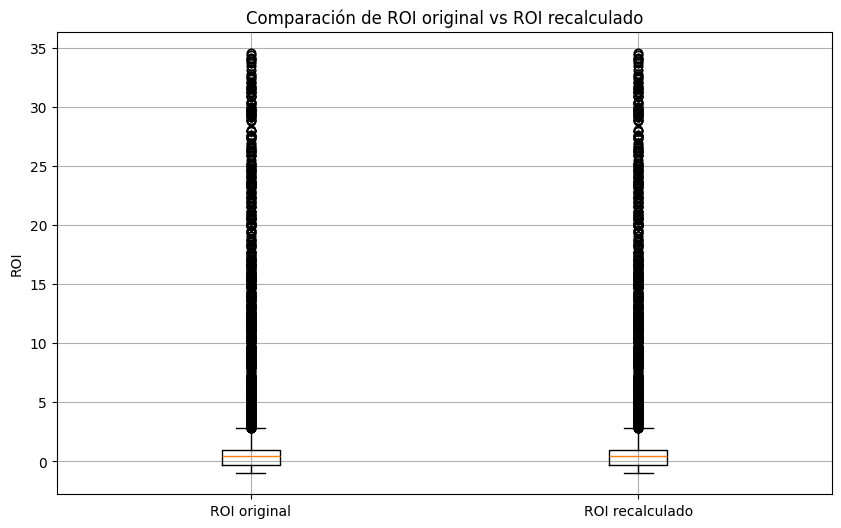

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Usar el dataframe previamente definido df_cruzado
# Crear ROI_calculado según fórmula: (Ingreso - CostoTotal) / CostoTotal
df_cruzado['ROI_calculado'] = df_cruzado.apply(
    lambda row: (row['Ingreso'] - row['CostoTotal']) / row['CostoTotal']
    if pd.notnull(row['Ingreso']) and pd.notnull(row['CostoTotal']) and row['CostoTotal'] != 0
    else None,
    axis=1
)

# Crear boxplot comparativo
plt.figure(figsize=(10, 6))
plt.boxplot(
    [df_cruzado['ROI'].dropna(), df_cruzado['ROI_calculado'].dropna()],
    labels=['ROI original', 'ROI recalculado'],
    showfliers=True
)
plt.title('Comparación de ROI original vs ROI recalculado')
plt.ylabel('ROI')
plt.grid(True)
plt.show()



In [ ]:
df_cruzado['diferencia_roi'] = df_cruzado['ROI'] - df_cruzado['ROI_calculado']
df_cruzado['diferencia_roi'].describe()


,diferencia_roi
count,9.274000e+03
mean,2.854988e-16
std,1.591145e-15
min,-7.105427e-15
25%,-6.591949e-17
50%,0.000000e+00
75%,2.220446e-16
max,1.776357e-14


In [ ]:
Q1 = df_cruzado['ROI'].quantile(0.25)
Q3 = df_cruzado['ROI'].quantile(0.75)
IQR = Q3 - Q1

limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

# Filtramos los outliers
outliers_roi = df_cruzado[(df_cruzado['ROI'] < limite_inferior) | (df_cruzado['ROI'] > limite_superior)]

# Cantidad de outliers
n_outliers = len(outliers_roi)
total = df_cruzado['ROI'].notna().sum()
porcentaje_outliers = (n_outliers / total) * 100

print(f"Valores atípicos de ROI: {n_outliers} de {total} registros ({porcentaje_outliers:.2f}%)")


Valores atípicos de ROI: 1413 de 9274 registros (15.24%)


In [ ]:
# Filtrar valores de ROI dentro de los límites calculados previamente (rango intercuartílico)
df_cruzado_roi_filtrado = df_cruzado[(df_cruzado['ROI'] >= limite_inferior) & (df_cruzado['ROI'] <= limite_superior)]

# Mostrar el número de registros que quedarían
cantidad_filtrada = len(df_cruzado_roi_filtrado)
cantidad_filtrada
df_cruzado_roi_filtrado.describe()

,Dia,Fecha,Cosecha_kg_,Numerodemuertos,Pesodemuestreo_g_,AlimentoReal_kg_,TA_porcentaje_,TC_porcentaje_,Sobrev,PesoCamaronReal_g_,...,ph,humedad,proteina_dumas,fibra,tyr,fosfolipidos,grasa,PesoInicial,ROI_calculado,diferencia_roi
count,7861.000000,7861,2128.000000,1733.000000,7861.000000,7400.000000,7861.000000,7861.000000,7861.000000,7861.000000,...,4473.000000,4748.000000,4748.000000,4748.000000,4748.000000,4748.000000,4748.000000,7861.000000,7861.000000,7.861000e+03
mean,39.356952,2023-02-25 19:41:09.762116608,0.136187,0.315638,13.399696,0.025391,1.088049,1.041997,96.606365,13.399696,...,7.197640,10.890389,36.579655,2.110607,1.235014,1.457278,6.850962,3.021804,0.198021,7.238218e-18
min,6.000000,2021-03-03 00:00:00,0.000000,0.000000,0.020000,0.000000,0.800000,0.870000,22.500000,0.020000,...,5.870500,9.720000,33.944000,0.950000,1.055000,0.600000,5.279026,0.004831,-1.000000,-1.776357e-15
25%,20.000000,2022-06-20 00:00:00,0.000000,0.000000,5.410000,0.010371,1.000000,1.000000,96.973000,5.410000,...,6.957500,10.560000,35.925500,1.875000,1.195000,1.214015,6.438656,1.270000,-0.410712,-1.110223e-16
50%,35.000000,2023-04-24 00:00:00,0.000000,0.000000,12.167500,0.020643,1.100000,1.000000,98.250000,12.167500,...,7.199000,10.756667,36.520000,2.105000,1.225000,1.525000,6.676347,1.510000,0.288730,0.000000e+00
75%,56.000000,2023-08-10 00:00:00,0.149700,0.000000,20.970000,0.035153,1.200000,1.000000,99.300000,20.970000,...,7.714000,11.140000,36.732500,2.370000,1.260000,1.696346,7.080000,2.177500,0.722723,1.110223e-16
max,111.000000,2024-10-12 00:00:00,2.267500,25.000000,32.000000,0.138702,1.500000,95.000000,113.333333,32.000000,...,8.675000,12.530000,42.335500,3.155000,1.454730,2.232549,10.359236,21.755556,2.801898,1.776357e-15
std,24.948860,NaN,0.316294,1.406506,8.915034,0.019373,0.109565,1.499914,6.480309,8.915034,...,0.605181,0.570062,1.098694,0.385614,0.065806,0.295534,0.920087,4.210281,0.888067,3.396096e-16


##Limpiando ROI: df_cruzado_roi_filtrado

In [ ]:
# Quitar zona horaria si existe
for col in df_cruzado_roi_filtrado.select_dtypes(include=["datetime64[ns, UTC]"]).columns:
    df_cruzado_roi_filtrado[col] = df_cruzado_roi_filtrado[col].dt.tz_localize(None)

# Ruta destino
ruta_salida = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_cruzado_roi_filtrado.xlsx"

# Guardar
df_cruzado_roi_filtrado.to_excel(ruta_salida, index=False)
print("✅ df_cruzado guardado exitosamente.")

✅ df_cruzado guardado exitosamente.


##Cargando df_cruzado_roi_filtrado

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd

# Cargar el DataFrame desde el archivo Excel
df_cruzado_roi_filtrado = pd.read_excel("/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_cruzado_roi_filtrado.xlsx")

In [ ]:
df_cruzado_roi_filtrado['sobrevivencia_limpia'] = (
    df_cruzado_roi_filtrado['Sobrevivenciacorregida3']
    .fillna(df_cruzado_roi_filtrado['Sobrev'])
)


Limpiamos los datos

In [ ]:
df_cruzado_roi_filtrado = df_cruzado_roi_filtrado[df_cruzado_roi_filtrado['sobrevivencia_limpia'] <= 100]


In [ ]:
# reemplazando el 95 de tc_porcentaje por 0.95

df_cruzado_roi_filtrado.loc[df_cruzado_roi_filtrado['TC_porcentaje_'] == 95, 'TC_porcentaje_'] = 0.95

df_cruzado_roi_filtrado = df_cruzado_roi_filtrado[df_cruzado_roi_filtrado['IC'] >= 0]

df_cruzado_roi_filtrado = df_cruzado_roi_filtrado[df_cruzado_roi_filtrado['FCAsem'] >= 0]

df_cruzado_roi_filtrado = df_cruzado_roi_filtrado[df_cruzado_roi_filtrado['FCAacu'] >= 0]

df_cruzado_roi_filtrado = df_cruzado_roi_filtrado[df_cruzado_roi_filtrado['GPsem'] >= 0]


Guardando df_cruzado_roi_filtrado v2

In [ ]:
# Quitar zona horaria si existe
for col in df_cruzado_roi_filtrado.select_dtypes(include=["datetime64[ns, UTC]"]).columns:
    df_cruzado_roi_filtrado[col] = df_cruzado_roi_filtrado[col].dt.tz_localize(None)

# Ruta destino
ruta_salida = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_cruzado_roi_filtrado.xlsx"

# Guardar
df_cruzado_roi_filtrado.to_excel(ruta_salida, index=False)
print("✅ df_cruzado guardado exitosamente.")

✅ df_cruzado guardado exitosamente.


##Guardando el resumen de df_cruzado_roi_filtrado

In [ ]:
import pandas as pd

# Generar resumen estadístico
resumen = df_cruzado_roi_filtrado.describe()

# Guardar como archivo Excel
ruta_salida = 'df_cruzado_roi_filtrado_describe.xlsx'
resumen.to_excel(ruta_salida)

print(f"Resumen guardado en: {ruta_salida}")


Resumen guardado en: df_cruzado_roi_filtrado_describe.xlsx


##Elegimos las variables e imputamos los valores faltantes

In [ ]:
import pandas as pd
from sklearn.impute import KNNImputer

# === Cargar el dataframe ===
# Asegúrate de reemplazar esto con la ruta correcta o el dataframe ya cargado
# df = pd.read_csv("df_cruzado_roi_filtrado.csv")

# === Lista de columnas a imputar ===
columnas_a_usar = [
    'O2_am', 'pH_am', 'T_am',
    'ph', 'humedad', 'proteina_dumas',
    'fibra', 'fosfolipidos', 'grasa',
   # 'zinc_mg_kg', 'cobre_mg_kg', 'silicio_mg_kg',
    'tyr', 'Semana', 'sobrevivencia_limpia',#'Dia',
    'Pesodemuestreo_g_', 'PesoInicial', 'IC',
    'FCAsem', 'FCAacu', 'GPsem',
    'GPacu','CAsem', 'CAacum',
    'AlimentoReal_kg_', 'Biomasa_kg_', 'TA_porcentaje_',
    'TC_porcentaje_', 'TA_porcentaje_', 'ROI',
    'ConsumoAlimento_g_cam_dia_'
]



# === Seleccionar solo las columnas necesarias ===
df_seleccionado = df_cruzado_roi_filtrado[columnas_a_usar].copy()

# === Imputar con KNN ===
imputer = KNNImputer(n_neighbors=5)
df_imputado = pd.DataFrame(imputer.fit_transform(df_seleccionado), columns=columnas_a_usar)

# === (Opcional) Unir con columnas originales ===
# df_actualizado = df.copy()
# df_actualizado[columnas_a_usar] = df_imputado

# === Guardar si lo deseas ===
# df_imputado.to_csv("df_imputado_knn.csv", index=False)


In [ ]:
# Quitar zona horaria si existe
for col in df_imputado.select_dtypes(include=["datetime64[ns, UTC]"]).columns:
    df_imputado[col] = df_imputado[col].dt.tz_localize(None)

# Ruta destino
ruta_salida = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_imputado_cruzado.xlsx"

# Guardar
df_imputado.to_excel(ruta_salida, index=False)
print("✅ df_imputado guardado exitosamente.")

✅ df_imputado guardado exitosamente.


#cargamos df_imputado_cruzado

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

# Ruta del archivo en tu Drive
ruta_excel = '/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_imputado_cruzado.xlsx'

#Nota: tiene el TA_porcentaje_ duplicado pero tienen los mismos valores

# Leer el archivo Excel
df = pd.read_excel(ruta_excel)

# Mostrar las primeras filas
df.head()



,O2_am,pH_am,T_am,ph,humedad,proteina_dumas,fibra,fosfolipidos,grasa,tyr,...,GPacu,CAsem,ConsumoAlimento_g_cam_dia_,AlimentoReal_g_,Biomasa_kg_,TA_porcentaje_,TC_porcentaje_,Precioalimento,PrecioCamaron,ROI
0,5.960,8.084,27.06,7.77,10.795,36.485,1.79,1.82,6.925,1.235,...,5.566667,36.524189,0.463569,0.0,0.239205,1.2,1.0,1.03,2.86295,2.246356
1,6.022,8.064,27.06,7.77,10.795,36.485,1.79,1.82,6.925,1.235,...,5.816667,41.454380,0.430396,0.0,0.249980,1.2,1.0,1.03,2.92475,2.235070
2,6.030,8.066,27.06,7.77,10.795,36.485,1.79,1.82,6.925,1.235,...,6.091667,39.354274,0.430396,0.0,0.260070,1.2,1.0,1.03,2.98710,2.496526
3,5.934,8.116,27.04,7.77,10.795,36.485,1.79,1.82,6.925,1.235,...,5.350000,34.354921,0.401226,0.0,0.259874,1.2,1.0,1.03,2.98710,2.587864
4,6.022,8.064,27.06,7.77,10.795,36.485,1.79,1.82,6.925,1.235,...,5.758333,41.329319,0.424719,0.0,0.273979,1.2,1.0,1.03,3.06195,2.556339


In [ ]:
df_imputado_cruzado = df.copy()

In [ ]:
df_imputado_cruzado = df_imputado.copy()

In [ ]:
df_imputado_cruzado.info()
df_imputado_cruzado.describe()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7321 entries, 0 to 7320
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   O2_am                       7321 non-null   float64
 1   pH_am                       7321 non-null   float64
 2   T_am                        7321 non-null   float64
 3   ph                          7321 non-null   float64
 4   humedad                     7321 non-null   float64
 5   proteina_dumas              7321 non-null   float64
 6   fibra                       7321 non-null   float64
 7   fosfolipidos                7321 non-null   float64
 8   grasa                       7321 non-null   float64
 9   tyr                         7321 non-null   float64
 10  Semana                      7321 non-null   float64
 11  sobrevivencia_limpia        7321 non-null   float64
 12  Pesodemuestreo_g_           7321 non-null   float64
 13  PesoInicial                 7321 

,O2_am,pH_am,T_am,ph,humedad,proteina_dumas,fibra,fosfolipidos,grasa,tyr,...,GPacu,CAsem,CAacum,AlimentoReal_kg_,Biomasa_kg_,TA_porcentaje_,TC_porcentaje_,TA_porcentaje_,ROI,ConsumoAlimento_g_cam_dia_
count,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000,...,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000,7321.000000
mean,5.770048,8.035884,28.566761,7.236798,10.886982,36.520270,2.110635,1.494363,6.819353,1.234063,...,10.300508,205.768201,940.828773,0.025828,0.807434,1.086771,1.019027,1.086771,0.177543,0.405841
std,0.441597,0.177162,2.111677,0.580825,0.502617,0.975243,0.342413,0.273577,0.819379,0.055430,...,8.167844,148.751786,948.208438,0.019472,0.688210,0.109464,0.054455,0.109464,0.870246,0.183675
min,5.000000,7.250000,23.700000,5.870500,9.720000,33.944000,0.950000,0.600000,5.279026,1.055000,...,0.014279,7.653745,7.653745,0.000000,0.001555,0.800000,0.870000,0.800000,-1.000000,0.006805
25%,5.400000,7.922000,26.920000,6.957500,10.588000,35.949500,1.920000,1.249411,6.465274,1.205000,...,3.380000,82.908327,190.982609,0.010632,0.256862,1.000000,1.000000,1.000000,-0.429687,0.270992
50%,5.774000,8.062000,28.140000,7.199000,10.784000,36.545600,2.102000,1.598641,6.634080,1.230000,...,8.130000,182.000000,527.748284,0.021329,0.561323,1.100000,1.000000,1.100000,0.295094,0.421899
75%,6.100000,8.160000,30.700000,7.779500,11.160000,36.741400,2.295000,1.700000,6.952505,1.256000,...,15.820000,280.519829,1497.020658,0.035320,1.331869,1.100000,1.000000,1.100000,0.722259,0.575966
max,7.600000,8.690000,33.500000,8.675000,12.530000,42.335500,3.155000,2.232549,10.359236,1.454730,...,31.183333,806.061666,4586.451501,0.138702,3.623250,1.500000,1.400000,1.500000,2.801898,1.206105


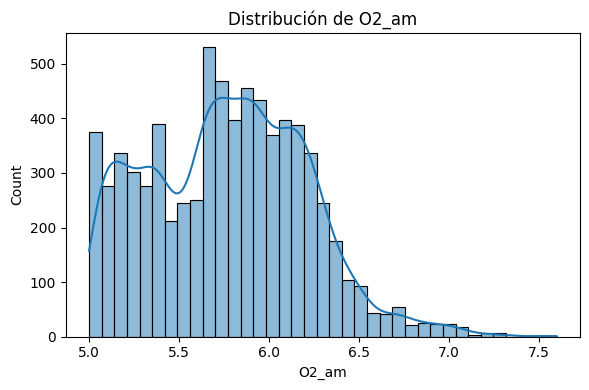

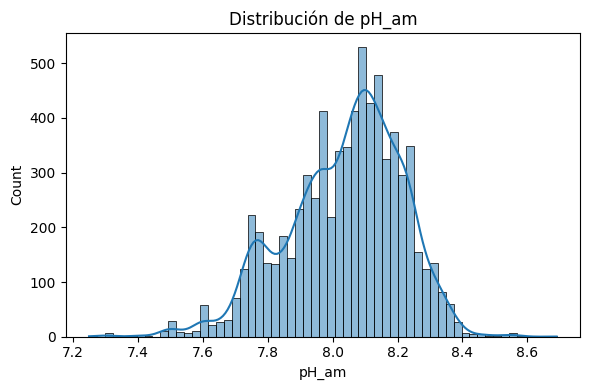

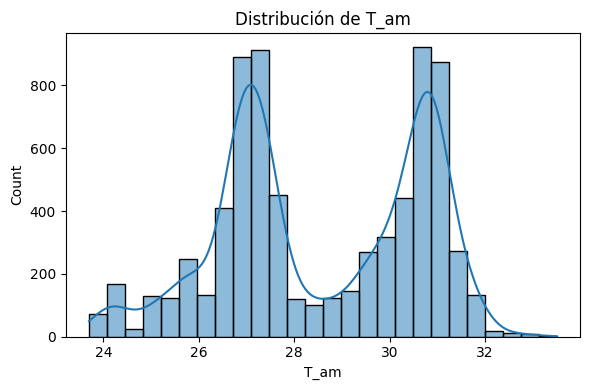

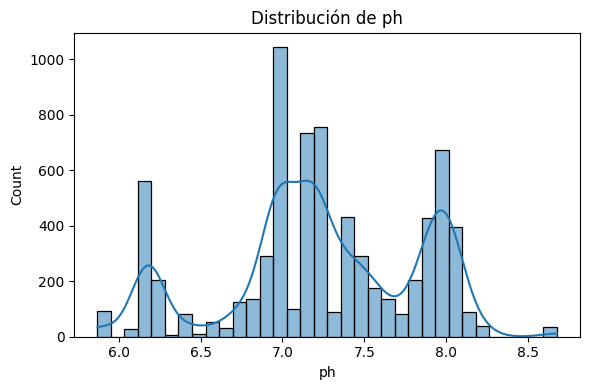

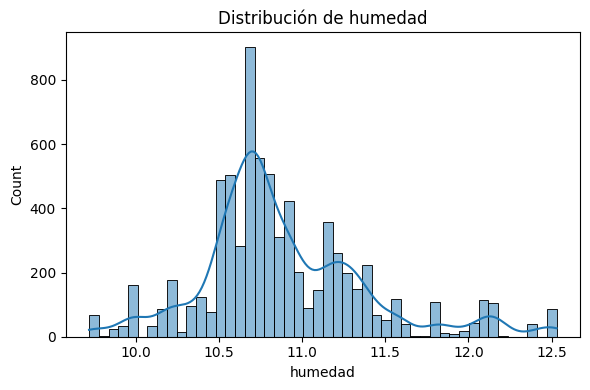

...

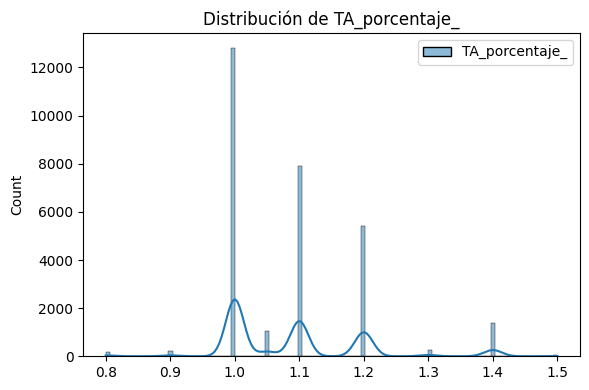

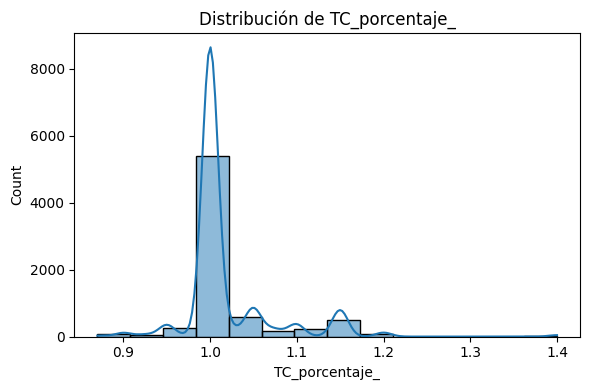

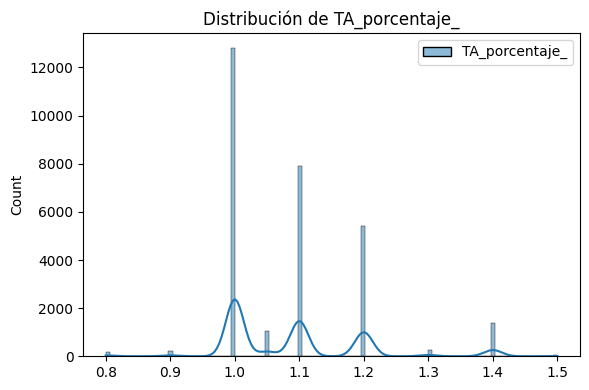

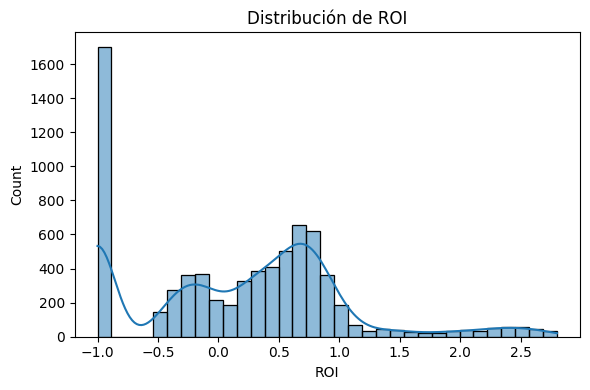

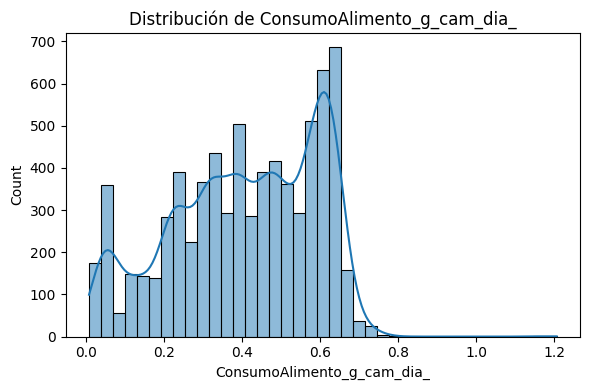

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in df_imputado.select_dtypes(include='number').columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_imputado[col], kde=True)
    plt.title(f"Distribución de {col}")
    plt.tight_layout()
    plt.show()


#Matriz de correlacion

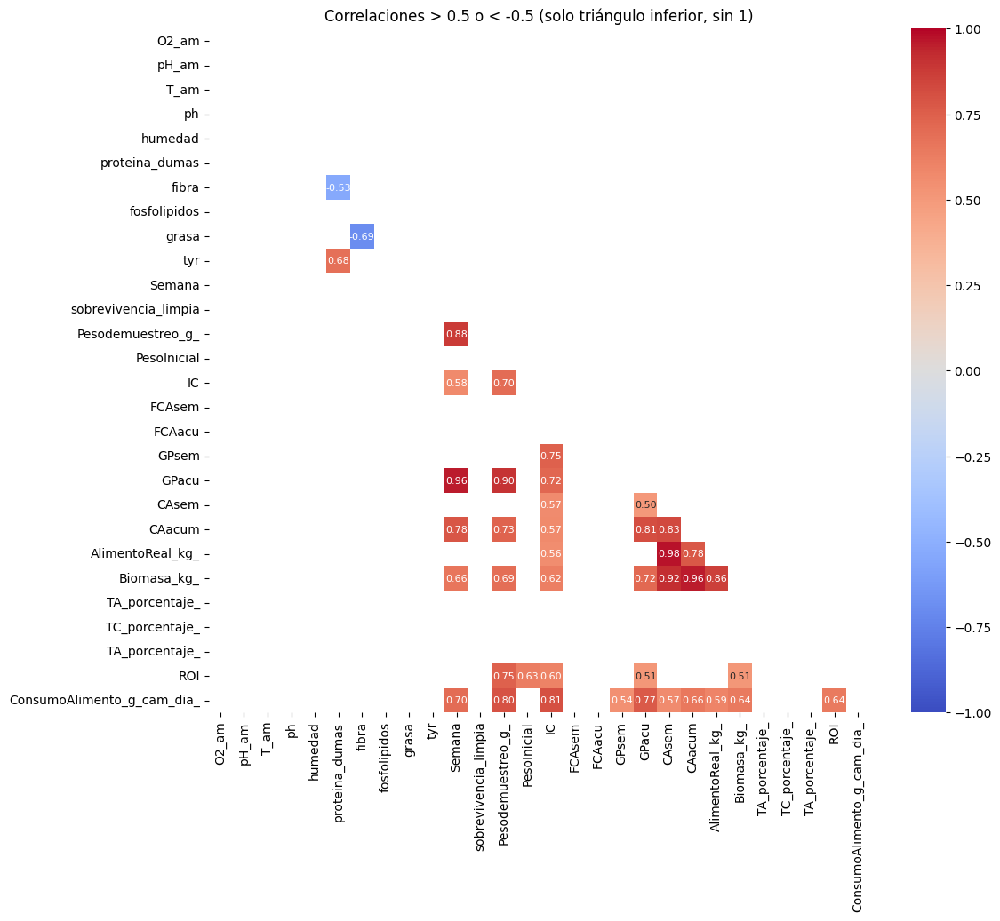

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Calcular matriz de correlación
corr_matrix = df_imputado.corr()

# Crear máscara para ocultar valores fuera del rango deseado y diferentes de 1
masked_corr = corr_matrix.where(
    ((corr_matrix > 0.5) | (corr_matrix < -0.5)) & (corr_matrix != 1)
)

# Crear máscara para el triángulo superior
mask_upper = np.triu(np.ones_like(masked_corr, dtype=bool))

plt.figure(figsize=(12, 10))
sns.heatmap(
    masked_corr,
    annot=True,
    annot_kws={"size": 8},
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,
    vmax=1,
    mask=mask_upper | masked_corr.isnull(),  # combinar con la máscara original
    cbar=True
)
plt.title("Correlaciones > 0.5 o < -0.5 (solo triángulo inferior, sin 1)")
plt.show()



In [ ]:
# Tabla con correlaciones destacadas
highlight_corr_table = masked_corr.stack().reset_index()
highlight_corr_table.columns = ["Variable 1", "Variable 2", "Correlación"]
highlight_corr_table = highlight_corr_table.sort_values("Correlación", ascending=False)

# Eliminar duplicados simétricos (opcional pero recomendable)
highlight_corr_table["key"] = highlight_corr_table[["Variable 1", "Variable 2"]].apply(lambda x: "_".join(sorted(x)), axis=1)
highlight_corr_table = highlight_corr_table.drop_duplicates(subset="key").drop(columns="key")

# Mostrar tabla
highlight_corr_table


,Variable 1,Variable 2,Correlación
55,AlimentoReal_kg_,CAsem,0.975672
8,Semana,GPacu,0.957122
52,CAacum,Biomasa_kg_,0.956235
63,Biomasa_kg_,CAsem,0.918259
33,GPacu,Pesodemuestreo_g_,0.903030
6,Semana,Pesodemuestreo_g_,0.880301
57,AlimentoReal_kg_,Biomasa_kg_,0.863621
50,CAacum,CAsem,0.829044
36,GPacu,CAacum,0.814257
76,ConsumoAlimento_g_cam_dia_,IC,0.809441


#Revisando resumen

In [ ]:
# Creamos una función que muestre los rangos y otras métricas de todas las columnas numéricas.

def resumen_columnas(df):
    resumen = pd.DataFrame({
        'min': df.min(numeric_only=True),
        'max': df.max(numeric_only=True),
        'rango': df.max(numeric_only=True) - df.min(numeric_only=True),
        'n_registros': len(df),
        'n_nulos': df.isna().sum(),
        'n_0': (df == 0).sum()
    })

    return resumen

# Solicitar al usuario que vuelva a cargar df_cruzado si no lo tiene disponible
resumen = resumen_columnas(df_imputado) if 'df_imputado' in globals() else "Por favor, vuelve a cargar df_imputado."
resumen

,min,max,rango,n_registros,n_nulos,n_0
O2_am,5.000000,7.600000,2.600000,7321,0,0
pH_am,7.250000,8.690000,1.440000,7321,0,0
T_am,23.700000,33.500000,9.800000,7321,0,0
ph,5.870500,8.675000,2.804500,7321,0,0
humedad,9.720000,12.530000,2.810000,7321,0,0
proteina_dumas,33.944000,42.335500,8.391500,7321,0,0
fibra,0.950000,3.155000,2.205000,7321,0,0
fosfolipidos,0.600000,2.232549,1.632549,7321,0,0
grasa,5.279026,10.359236,5.080210,7321,0,0
tyr,1.055000,1.454730,0.399730,7321,0,0


#Agregar ruido gaussiano proporcional a la informacion nutricional

In [ ]:
##EVITAMOS QUE SE GENERE RUIDO CON VALORES NEGATIVOS

import numpy as np

# Copia del DataFrame original
df_ruido = df_imputado.copy()

# Solo columnas nutricionales
columnas_nutricionales = [
    'proteina_dumas', 'fibra', 'fosfolipidos', 'grasa', 'tyr','humedad',  'ph' ] # solo nutricionales

# Agregar ruido proporcional (5% del std), evitando negativos
for col in columnas_nutricionales:
    std = df_ruido[col].std()
    if std == 0 or np.isnan(std):
        continue
    ruido = np.random.normal(loc=0, scale=0.05 * std, size=df_ruido.shape[0])
    df_ruido[col] += ruido
    df_ruido[col] = df_ruido[col].clip(lower=0)  # Evita valores negativos




In [ ]:
duplicadas = df_ruido.columns[df_ruido.columns.duplicated()].tolist()
print("Columnas duplicadas:", duplicadas)


Columnas duplicadas: ['TA_porcentaje_']


In [ ]:
df_ruido = df_ruido.loc[:, ~df_ruido.columns.duplicated()]


In [ ]:
df_ruido

,O2_am,pH_am,T_am,ph,humedad,proteina_dumas,fibra,fosfolipidos,grasa,tyr,...,GPsem,GPacu,CAsem,CAacum,AlimentoReal_kg_,Biomasa_kg_,TA_porcentaje_,TC_porcentaje_,ROI,ConsumoAlimento_g_cam_dia_
0,6.074,8.042,27.08,7.735646,10.749703,36.477572,1.760608,1.812587,6.980954,1.240187,...,1.608913,5.566667,36.524189,118.887665,0.004044,0.239205,1.2,1.0,2.246356,0.457838
1,6.168,8.030,27.06,7.782733,10.812439,36.453599,1.795739,1.806319,6.859886,1.235057,...,1.572554,5.816667,41.454380,133.496395,0.003688,0.249980,1.2,1.0,2.235070,0.417583
2,6.182,8.008,27.06,7.789720,10.776186,36.449656,1.788271,1.798313,6.923643,1.236190,...,1.631638,6.091667,39.354274,129.785284,0.003482,0.260070,1.2,1.0,2.496526,0.394248
3,6.122,8.020,27.10,7.811984,10.790846,36.519850,1.775650,1.822472,6.900787,1.235420,...,1.586188,5.350000,34.354921,124.135534,0.003985,0.259874,1.2,1.0,2.587864,0.451177
4,6.116,8.058,27.04,7.784756,10.804792,36.503919,1.785353,1.830530,6.925191,1.234383,...,1.495289,5.758333,41.329319,143.098680,0.003617,0.273979,1.2,1.0,2.556339,0.405947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7316,6.262,7.850,30.00,7.738914,12.459132,36.952345,1.789327,1.265866,8.028889,1.304584,...,1.640250,4.794821,590.884506,1417.033816,0.076063,1.548434,1.1,1.0,0.068101,0.478709
7317,5.978,7.606,30.94,7.721967,12.394191,37.003608,1.780126,1.267404,7.998055,1.304485,...,2.737250,7.532071,634.914206,1975.885423,0.084747,1.978746,1.1,1.0,0.626959,0.534610
7318,6.280,7.734,30.36,7.614376,12.393539,36.966476,1.789555,1.264752,8.068521,1.304942,...,2.895000,10.427071,693.147571,2584.285765,0.090606,2.430801,1.1,1.0,0.756386,0.573180
7319,6.292,7.850,30.00,7.778413,12.333310,36.919208,1.788620,1.237154,8.122531,1.306975,...,2.015000,12.442071,736.655124,3230.335302,0.094244,2.741336,1.1,1.0,0.739522,0.597936


In [ ]:
#guardando df_ruido
# Guardar en Excel
ruta = '/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_ruido.xlsx'
df_ruido.to_excel(ruta)
print(f"✅ Resumen guardado en: {ruta}")

✅ Resumen guardado en: /content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_ruido.xlsx


#Revisando la correlacion luego de agregar ruido

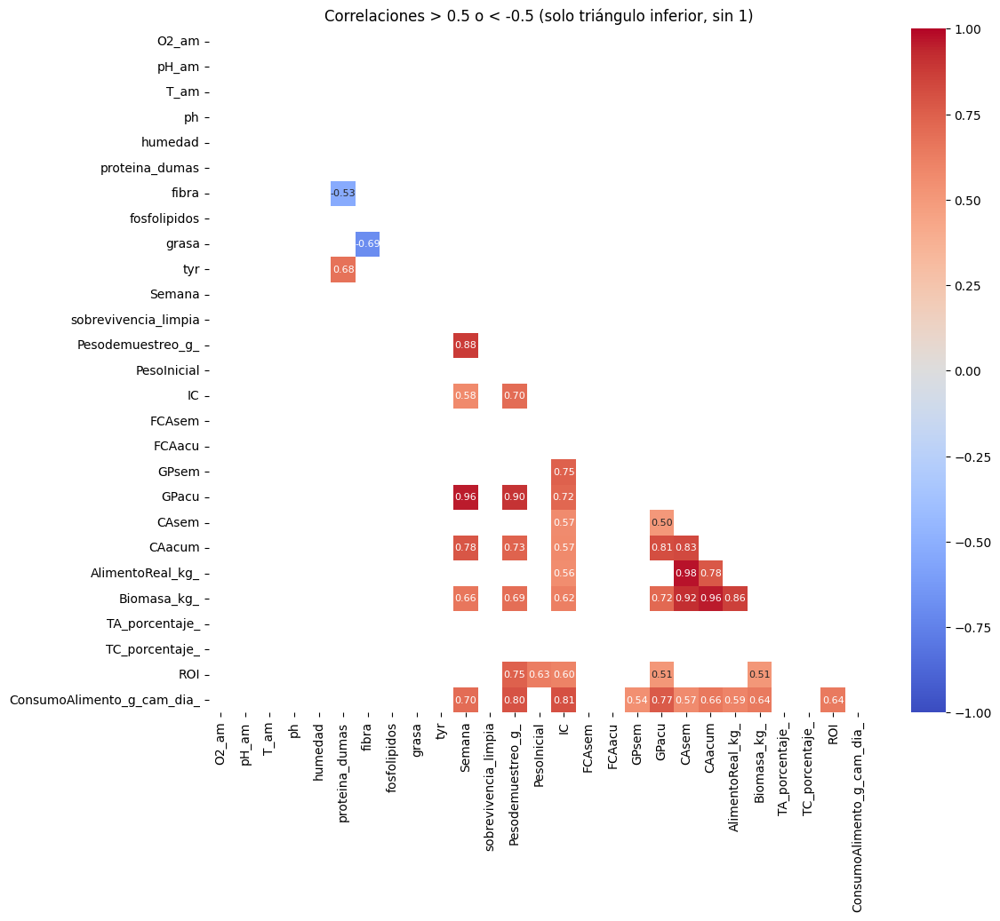

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Calcular matriz de correlación
corr_matrix = df_ruido.corr()

# Crear máscara para ocultar valores fuera del rango deseado y diferentes de 1
masked_corr = corr_matrix.where(
    ((corr_matrix > 0.5) | (corr_matrix < -0.5)) & (corr_matrix != 1)
)

# Crear máscara para el triángulo superior
mask_upper = np.triu(np.ones_like(masked_corr, dtype=bool))

plt.figure(figsize=(12, 10))
sns.heatmap(
    masked_corr,
    annot=True,
    annot_kws={"size": 8},
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,
    vmax=1,
    mask=mask_upper | masked_corr.isnull(),  # combinar con la máscara original
    cbar=True
)
plt.title("Correlaciones > 0.5 o < -0.5 (solo triángulo inferior, sin 1)")
plt.show()


#Revision resumen df_ruido

In [ ]:
# Creamos una función que muestre los rangos y otras métricas de todas las columnas numéricas.

def resumen_columnas(df):
    resumen = pd.DataFrame({
        'min': df.min(numeric_only=True),
        'max': df.max(numeric_only=True),
        'rango': df.max(numeric_only=True) - df.min(numeric_only=True),
        'n_registros': len(df),
        'n_nulos': df.isna().sum(),
        'n_0': (df == 0).sum()
    })

    return resumen

# Solicitar al usuario que vuelva a cargar df_cruzado si no lo tiene disponible
resumen = resumen_columnas(df_ruido) if 'df_ruido' in globals() else "Por favor, vuelve a cargar df_cruzado."
resumen

,min,max,rango,n_registros,n_nulos,n_0
O2_am,5.000000,7.600000,2.600000,7321,0,0
pH_am,7.250000,8.690000,1.440000,7321,0,0
T_am,23.700000,33.500000,9.800000,7321,0,0
ph,5.814702,8.729712,2.915009,7321,0,0
humedad,9.672564,12.587069,2.914505,7321,0,0
proteina_dumas,33.844461,42.359386,8.514925,7321,0,0
fibra,0.926483,3.190403,2.263920,7321,0,0
fosfolipidos,0.584944,2.248244,1.663300,7321,0,0
grasa,5.203492,10.430821,5.227329,7321,0,0
tyr,1.048389,1.461620,0.413231,7321,0,0


## Aplicando red adversaria generativa (GAN)

In [ ]:
# PASO 1: Preparar el entorno
!pip install torch torchvision

import torch
import torch.nn as nn
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Copia de df_ruido para ajustarlo sin modificar el original
df_ruido_adj = df_ruido.copy()

# PASO EXTRA: Forzar el rango mínimo en T_am para entrenamiento del scaler
if 'T_am' in df_ruido.columns:
    fila_ficticia = {col: df_ruido[col].mean() for col in df_ruido.columns}
    fila_ficticia['T_am'] = 20
    df_ruido_adj = pd.concat([df_ruido_adj, pd.DataFrame([fila_ficticia])], ignore_index=True)

# PASO 2: Normalizar los datos con rango ajustado
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(df_ruido_adj)

# Convertimos a tensor solo los datos originales (sin la fila ficticia)
data_tensor = torch.tensor(data_scaled[:len(df_ruido)], dtype=torch.float32)

# PASO 3: Definir la GAN
input_dim = data_tensor.shape[1]
latent_dim = 10

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 32),
            nn.ReLU(),
            nn.Linear(32, input_dim),
            nn.ReLU()  # 👈 Garantiza salidas >= 0
        )

    def forward(self, z):
        return self.model(z)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 32),
            nn.ReLU(),
            nn.Linear(32, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)

# PASO 4: Entrenamiento de la GAN
generator = Generator()
discriminator = Discriminator()
criterion = nn.BCELoss()
lr = 0.0002

g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr)
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr)

epochs = 5000
batch_size = 64

for epoch in range(epochs):
    # Entrenamiento del discriminador
    real_data = data_tensor[torch.randint(0, len(data_tensor), (batch_size,))]
    fake_z = torch.randn(batch_size, latent_dim)
    fake_data = generator(fake_z)

    real_labels = torch.ones(batch_size, 1)
    fake_labels = torch.zeros(batch_size, 1)

    d_loss_real = criterion(discriminator(real_data), real_labels)
    d_loss_fake = criterion(discriminator(fake_data.detach()), fake_labels)
    d_loss = d_loss_real + d_loss_fake

    d_optimizer.zero_grad()
    d_loss.backward()
    d_optimizer.step()

    # Entrenamiento del generador
    g_loss = criterion(discriminator(fake_data), real_labels)
    g_optimizer.zero_grad()
    g_loss.backward()
    g_optimizer.step()

    if epoch % 1000 == 0:
        print(f"Epoch {epoch}: D_loss={d_loss.item():.4f}, G_loss={g_loss.item():.4f}")

# PASO 5: Generar nuevos datos
z = torch.randn(1000, latent_dim)
fake_samples = generator(z).detach().numpy()

# Clip antes de desnormalizar
fake_samples = np.clip(fake_samples, a_min=0, a_max=1)

# Desnormalizar
fake_samples = scaler.inverse_transform(fake_samples)

# Clip final general
fake_samples = np.clip(fake_samples, a_min=0, a_max=None)

# PASO EXTRA: aplicar restricciones por columna
restricciones = {
    'T_am': (20, 34),     # T_am en 20–34 °C
    'T_pm': (20, 34),     # T_pm si existe
    'TC_porcentaje_': (0, 1),
    'Supervivencia': (0, 100),
    'ROI': (0, None)
}

for col, (min_val, max_val) in restricciones.items():
    if col in df_ruido.columns:
        idx = df_ruido.columns.get_loc(col)
        fake_samples[:, idx] = np.clip(fake_samples[:, idx], a_min=min_val, a_max=max_val)

# Crear DataFrame sintético
df_sintetico_gan = pd.DataFrame(fake_samples, columns=df_ruido.columns)

# PASO 6: Combinar y guardar
df_augmented = pd.concat([df_ruido, df_sintetico_gan], ignore_index=True)



Epoch 0: D_loss=1.3822, G_loss=0.6419
Epoch 1000: D_loss=1.3517, G_loss=0.6915
Epoch 2000: D_loss=1.3671, G_loss=0.7212
Epoch 3000: D_loss=1.3895, G_loss=0.6834
Epoch 4000: D_loss=1.3540, G_loss=0.7476


In [ ]:
ruta_guardado = '/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_augmented_gan.xlsx'
df_augmented.to_excel(ruta_guardado, index=False)
print(f"✅ Archivo guardado: {ruta_guardado}")



✅ Archivo guardado: /content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_augmented_gan.xlsx


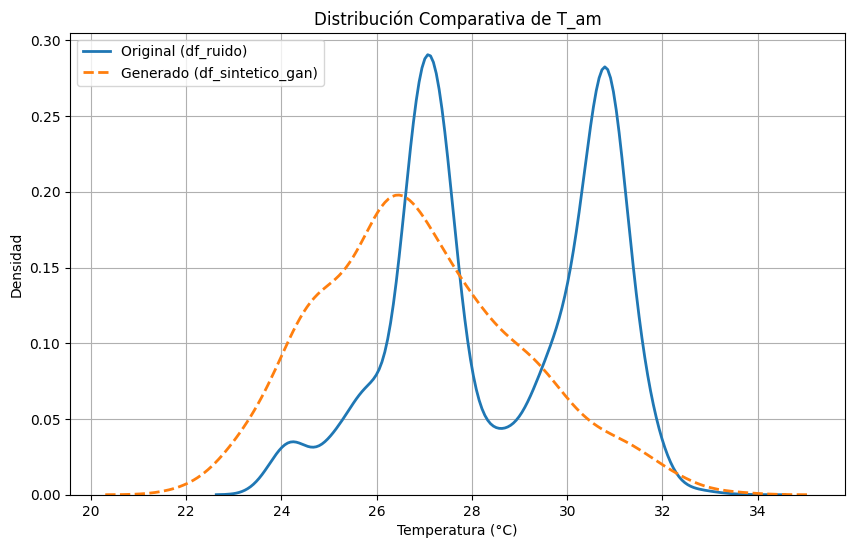

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Verificamos que exista la columna
if 'T_am' in df_sintetico_gan.columns and 'T_am' in df_ruido.columns:
    plt.figure(figsize=(10, 6))
    sns.kdeplot(df_ruido['T_am'], label='Original (df_ruido)', linewidth=2)
    sns.kdeplot(df_sintetico_gan['T_am'], label='Generado (df_sintetico_gan)', linewidth=2, linestyle='--')
    plt.title('Distribución Comparativa de T_am')
    plt.xlabel('Temperatura (°C)')
    plt.ylabel('Densidad')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("❌ La columna 'T_am' no existe en uno de los dataframes.")


PCA con comparación real vs. sintético

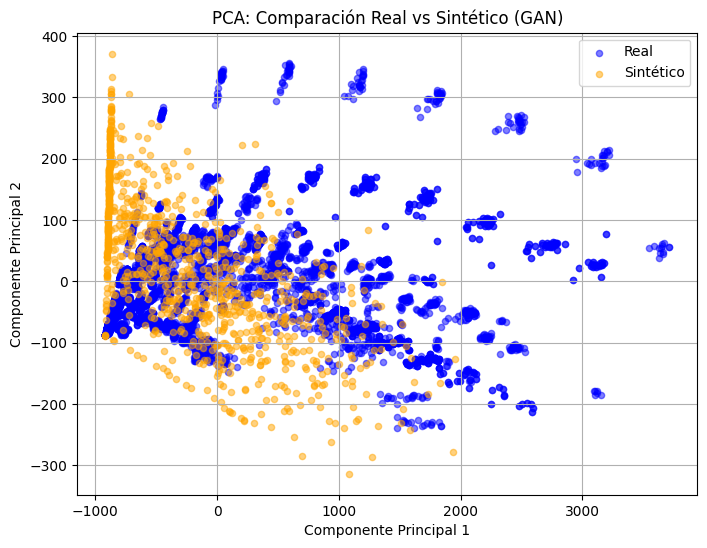

Varianza explicada por PC1 y PC2: 99.92%


In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Crear una etiqueta para identificar real vs sintético
df_real = df_ruido.copy()
df_real['origen'] = 'Real'
df_sint = df_sintetico_gan.copy()
df_sint['origen'] = 'Sintético'

# Combinar
df_comp = pd.concat([df_real, df_sint], ignore_index=True)

# Seleccionar solo variables numéricas
X = df_comp.select_dtypes(include=[np.number]).drop(columns=['origen'], errors='ignore')

# Aplicar PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# DataFrame con componentes
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['origen'] = df_comp['origen'].values

# Graficar
plt.figure(figsize=(8,6))
for label, color in [('Real', 'blue'), ('Sintético', 'orange')]:
    subset = df_pca[df_pca['origen'] == label]
    plt.scatter(subset['PC1'], subset['PC2'], label=label, alpha=0.5, s=20, color=color)

plt.title('PCA: Comparación Real vs Sintético (GAN)')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.legend()
plt.grid(True)
plt.show()

# Mostrar varianza explicada
print(f"Varianza explicada por PC1 y PC2: {pca.explained_variance_ratio_.sum():.2%}")


###WGAN básico desde df_ruido

In [ ]:
# PASO 1: Instalar y preparar
!pip install torch torchvision

import torch
import torch.nn as nn
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Ajustar rango de T_am para forzar mínimo 20
df_ruido_adj = df_ruido.copy()
if 'T_am' in df_ruido.columns:
    fila_ficticia = {col: df_ruido[col].mean() for col in df_ruido.columns}
    fila_ficticia['T_am'] = 20
    df_ruido_adj = pd.concat([df_ruido_adj, pd.DataFrame([fila_ficticia])], ignore_index=True)

# Normalizar
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(df_ruido_adj)
data_tensor = torch.tensor(data_scaled[:len(df_ruido)], dtype=torch.float32)

# PASO 2: Red y configuración WGAN
input_dim = data_tensor.shape[1]
latent_dim = 10

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
            nn.Linear(64, input_dim)
        )

    def forward(self, z):
        return self.model(z)

class Critic(nn.Module):  # No sigmoid, no probabilidad
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
            nn.Linear(64, 1)
        )

    def forward(self, x):
        return self.model(x)

# PASO 3: Inicialización
generator = Generator()
critic = Critic()

g_optimizer = torch.optim.RMSprop(generator.parameters(), lr=5e-5)
c_optimizer = torch.optim.RMSprop(critic.parameters(), lr=5e-5)

epochs = 5000
batch_size = 64
clip_value = 0.01
n_critic = 5  # Número de pasos del crítico por cada paso del generador

# PASO 4: Entrenamiento
for epoch in range(epochs):
    for _ in range(n_critic):
        real_data = data_tensor[torch.randint(0, len(data_tensor), (batch_size,))]
        fake_z = torch.randn(batch_size, latent_dim)
        fake_data = generator(fake_z).detach()

        c_loss = -(critic(real_data).mean() - critic(fake_data).mean())

        c_optimizer.zero_grad()
        c_loss.backward()
        c_optimizer.step()

        # Clipping de pesos
        for p in critic.parameters():
            p.data.clamp_(-clip_value, clip_value)

    # Generador
    fake_z = torch.randn(batch_size, latent_dim)
    fake_data = generator(fake_z)
    g_loss = -critic(fake_data).mean()

    g_optimizer.zero_grad()
    g_loss.backward()
    g_optimizer.step()

    if epoch % 1000 == 0:
        print(f"Epoch {epoch}: Critic Loss = {c_loss.item():.4f}, Generator Loss = {g_loss.item():.4f}")

# PASO 5: Generar datos sintéticos
z = torch.randn(1000, latent_dim)
fake_samples = generator(z).detach().numpy()
fake_samples = scaler.inverse_transform(fake_samples)
fake_samples = np.clip(fake_samples, a_min=0, a_max=None)

# Restringir columnas específicas
restricciones = {
    'T_am': (20, 34),
    'T_pm': (20, 34),
    'TC_porcentaje_': (0, 1),
    'Supervivencia': (0, 100),
    'ROI': (0, None)
}
for col, (min_val, max_val) in restricciones.items():
    if col in df_ruido.columns:
        idx = df_ruido.columns.get_loc(col)
        fake_samples[:, idx] = np.clip(fake_samples[:, idx], a_min=min_val, a_max=max_val)

df_sintetico_wgan = pd.DataFrame(fake_samples, columns=df_ruido.columns)
df_augmented_wgan = pd.concat([df_ruido, df_sintetico_wgan], ignore_index=True)

# PASO 6: Guardar en Excel
ruta = '/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_augmented_wgan.xlsx'
df_augmented_wgan.to_excel(ruta, index=False)
print(f"✅ Archivo WGAN guardado en: {ruta}")


Epoch 0: Critic Loss = 0.0000, Generator Loss = 0.0106
Epoch 1000: Critic Loss = -0.0002, Generator Loss = 0.0106
Epoch 2000: Critic Loss = -0.0001, Generator Loss = 0.0107
Epoch 3000: Critic Loss = -0.0000, Generator Loss = 0.0104
Epoch 4000: Critic Loss = -0.0001, Generator Loss = 0.0106
✅ Archivo WGAN guardado en: /content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_augmented_wgan.xlsx



Análisis PCA: Real vs WGAN

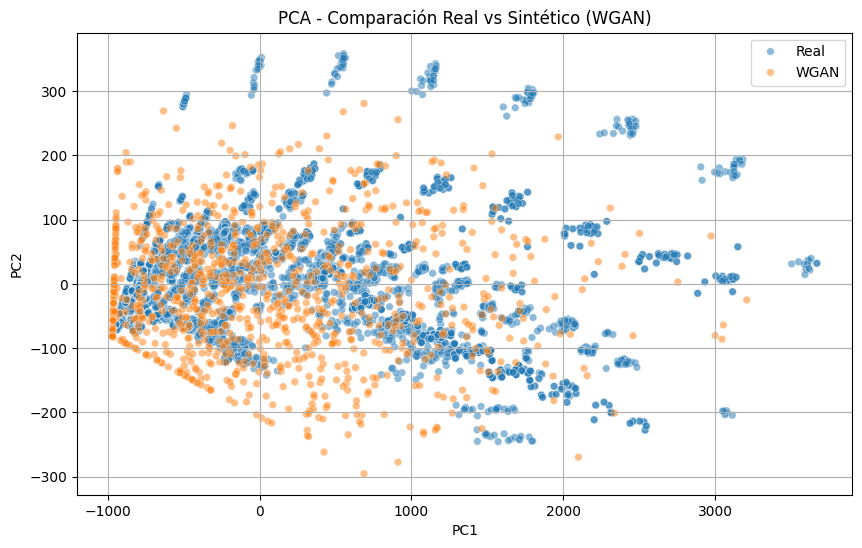

✔️ Varianza explicada por PC1 + PC2: 99.89%


In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Etiquetar el origen de los datos
df_real = df_ruido.copy()
df_real['origen'] = 'Real'

df_sint = df_sintetico_wgan.copy()
df_sint['origen'] = 'WGAN'

# Combinar
df_pca_input = pd.concat([df_real, df_sint], ignore_index=True)

# Seleccionar solo columnas numéricas
X = df_pca_input.select_dtypes(include=[np.number]).drop(columns=['origen'], errors='ignore')

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Armar DataFrame con resultados
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['origen'] = df_pca_input['origen'].values

# Gráfico
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='origen', alpha=0.5, s=30)
plt.title('PCA - Comparación Real vs Sintético (WGAN)')
plt.grid(True)
plt.legend()
plt.show()

# Varianza explicada
print(f"✔️ Varianza explicada por PC1 + PC2: {pca.explained_variance_ratio_.sum():.2%}")


Para confirmar aún más esta similitud, se puede:

📈 Comparar distribuciones variable a variable con:

KDE

Boxplot

Kolmogorov–Smirnov test (KS-test)

🧪 Medir distancia de distribución (Jensen-Shannon, Wasserstein)



SCRIPT DE COMPARACIÓN VARIABLE A VARIABLE

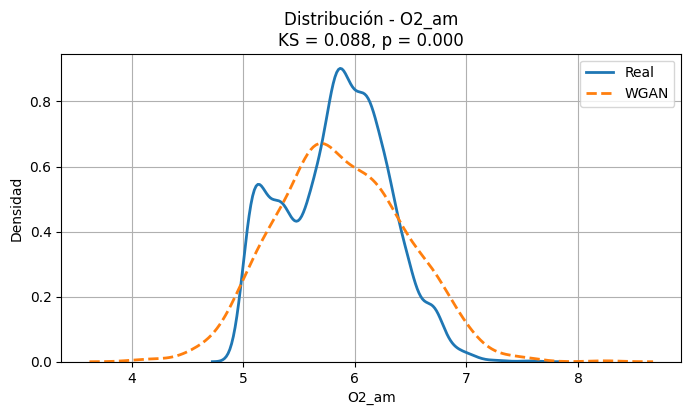

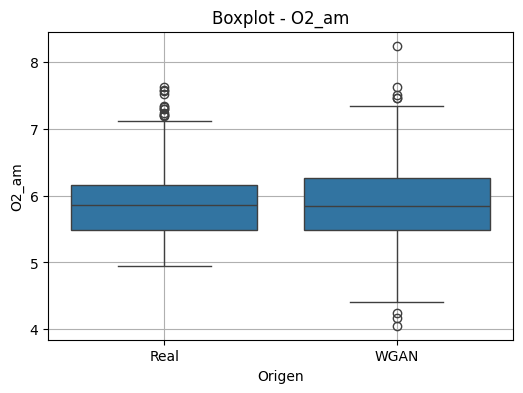

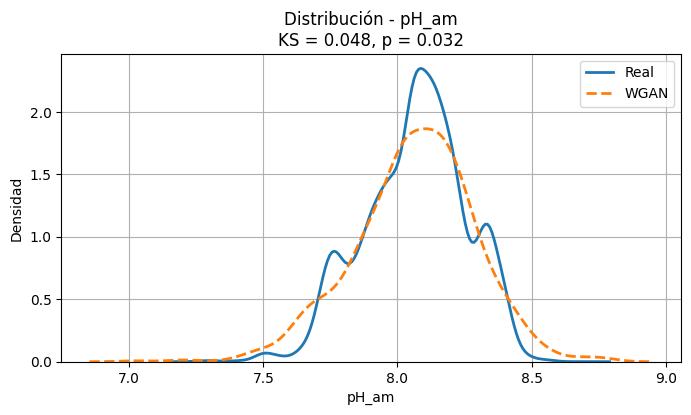

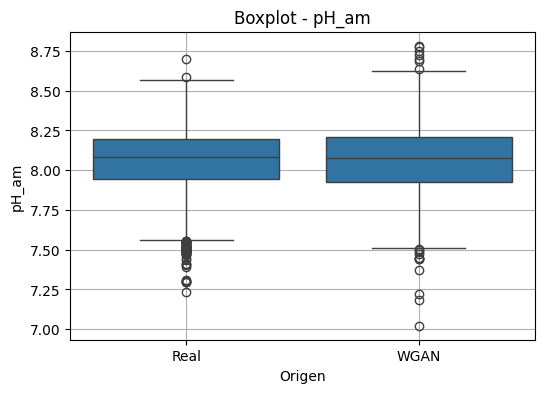

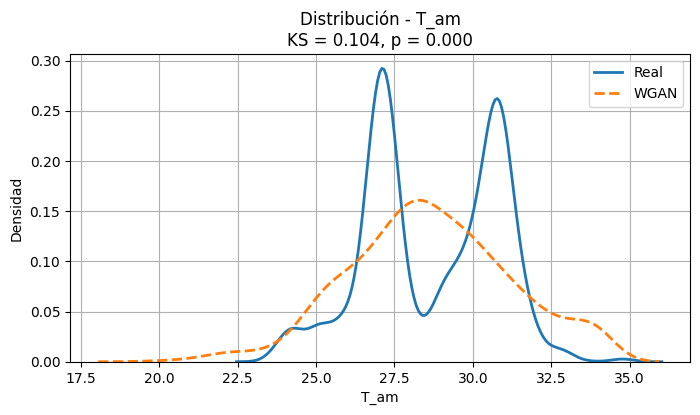

...

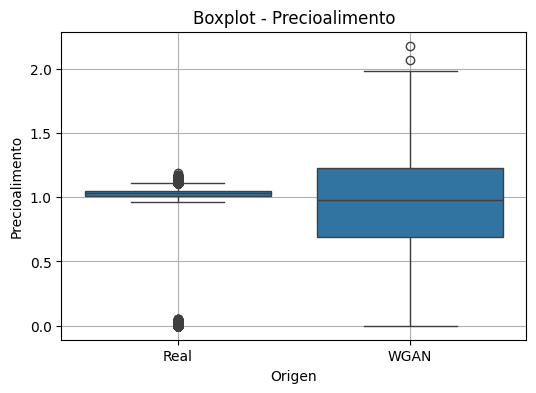

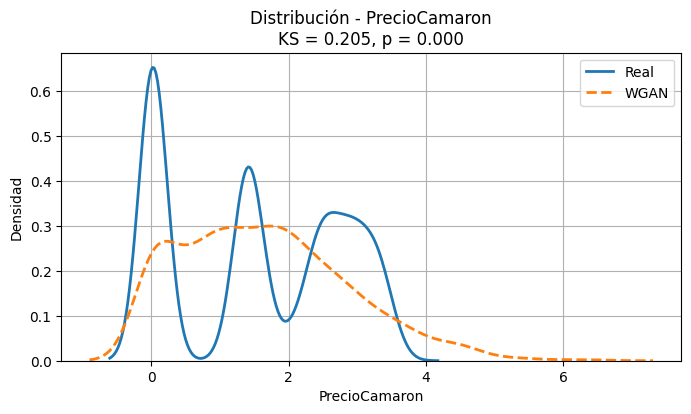

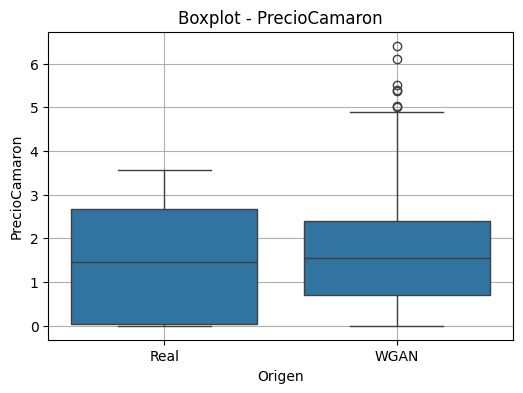

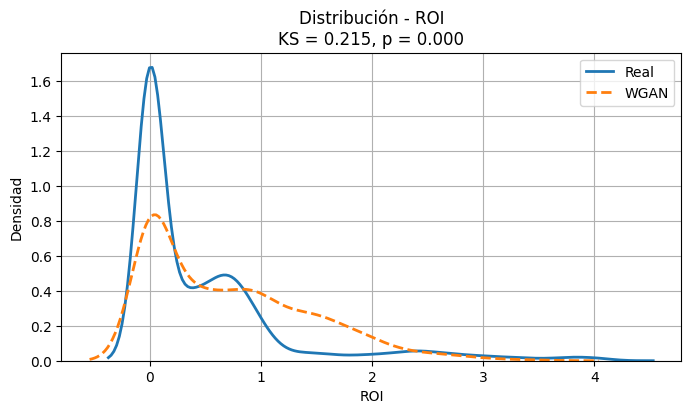

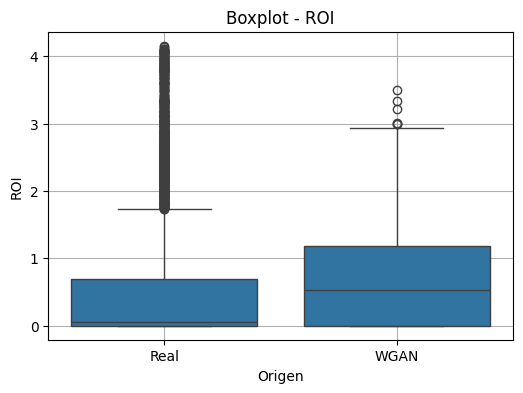

Resumen del KS-test Real vs WGAN (ordenado por disimilitud):


,Variable,KS_Statistic,P_value
0,TC_porcentaje_,0.567240,4.234483e-269
1,FCAsem,0.535068,2.916142e-237
2,FCAacu,0.436650,1.717547e-154
3,Precioalimento,0.366589,1.220870e-107
4,ROI,0.215260,1.001765e-36
5,PrecioCamaron,0.204929,2.678558e-33
6,TA_porcentaje_,0.190673,7.437033e-29
7,proteina_dumas,0.179862,1.050956e-25
8,Biomasa_kg_,0.160767,1.336036e-20
9,grasa,0.155312,2.996231e-19


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ks_2samp

# Variables numéricas comunes
vars_comunes = df_ruido.select_dtypes(include='number').columns.intersection(df_sintetico_wgan.columns)

# Inicializar tabla para guardar resultados del KS-test
ks_resultados = []

for var in vars_comunes:
    real_vals = df_ruido[var].dropna()
    sint_vals = df_sintetico_wgan[var].dropna()

    # KS test
    ks_stat, p_value = ks_2samp(real_vals, sint_vals)
    ks_resultados.append({
        'Variable': var,
        'KS_Statistic': ks_stat,
        'P_value': p_value
    })

    # 📈 KDE plot
    plt.figure(figsize=(8, 4))
    sns.kdeplot(real_vals, label='Real', linewidth=2)
    sns.kdeplot(sint_vals, label='WGAN', linestyle='--', linewidth=2)
    plt.title(f'Distribución - {var}\nKS = {ks_stat:.3f}, p = {p_value:.3f}')
    plt.xlabel(var)
    plt.ylabel('Densidad')
    plt.legend()
    plt.grid(True)
    plt.show()

    # 📊 Boxplot
    df_temp = pd.DataFrame({
        var: pd.concat([real_vals, sint_vals], ignore_index=True),
        'Origen': ['Real'] * len(real_vals) + ['WGAN'] * len(sint_vals)
    })

    plt.figure(figsize=(6, 4))
    sns.boxplot(data=df_temp, x='Origen', y=var)
    plt.title(f'Boxplot - {var}')
    plt.grid(True)
    plt.show()

# Mostrar resumen de KS-test
df_ks = pd.DataFrame(ks_resultados)
df_ks_sorted = df_ks.sort_values(by='KS_Statistic', ascending=False).reset_index(drop=True)

# Mostrar resumen de KS-test en Colab
print("Resumen del KS-test Real vs WGAN (ordenado por disimilitud):")
display(df_ks_sorted)


Script WGAN-GP CPU


In [ ]:
# PASO 1: Librerías
!pip install -q torch torchvision
from google.colab import drive
drive.mount('/content/drive')

import torch
import torch.nn as nn
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from torch.autograd import grad

# PASO 2: Leer datos y preparar
ruta_ruido = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_ruido.xlsx"
df_ruido = pd.read_excel(ruta_ruido)

# Selección de columnas numéricas
cols_objetivo = df_ruido.select_dtypes(include=[np.number]).columns.tolist()
df_focus = df_ruido[cols_objetivo].dropna().reset_index(drop=True)

# Escalar
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(df_focus)
data_tensor = torch.tensor(data_scaled, dtype=torch.float32)

# PASO 3: Redes
input_dim = data_tensor.shape[1]
latent_dim = 10

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Linear(128, input_dim)
        )

    def forward(self, z):
        return self.model(z)

class Critic(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        return self.model(x)

# PASO 4: Penalización de gradiente
def gradient_penalty(critic, real_data, fake_data):
    alpha = torch.rand(real_data.size(0), 1)
    alpha = alpha.expand_as(real_data)
    interpolated = alpha * real_data + (1 - alpha) * fake_data
    interpolated.requires_grad_(True)

    prob_interpolated = critic(interpolated)
    gradients = grad(
        outputs=prob_interpolated,
        inputs=interpolated,
        grad_outputs=torch.ones_like(prob_interpolated),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]
    gradients = gradients.view(real_data.size(0), -1)
    penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return penalty

# PASO 5: Entrenamiento
generator = Generator()
critic = Critic()

g_optimizer = torch.optim.Adam(generator.parameters(), lr=1e-4, betas=(0.5, 0.9))
c_optimizer = torch.optim.Adam(critic.parameters(), lr=1e-4, betas=(0.5, 0.9))

epochs = 2000
batch_size = 64
lambda_gp = 10
n_critic = 5

for epoch in range(epochs):
    for _ in range(n_critic):
        idx = torch.randint(0, len(data_tensor), (batch_size,))
        real_data = data_tensor[idx]
        z = torch.randn(batch_size, latent_dim)
        fake_data = generator(z).detach()

        critic_real = critic(real_data)
        critic_fake = critic(fake_data)

        gp = gradient_penalty(critic, real_data, fake_data)
        c_loss = -(critic_real.mean() - critic_fake.mean()) + lambda_gp * gp

        c_optimizer.zero_grad()
        c_loss.backward()
        c_optimizer.step()

    z = torch.randn(batch_size, latent_dim)
    fake_data = generator(z)
    g_loss = -critic(fake_data).mean()

    g_optimizer.zero_grad()
    g_loss.backward()
    g_optimizer.step()

    if epoch % 500 == 0:
        print(f"Epoch {epoch} | Critic Loss: {c_loss.item():.4f} | Generator Loss: {g_loss.item():.4f}")

# PASO 6: Generar y guardar
z = torch.randn(1000, latent_dim)
fake_samples = generator(z).detach().numpy()
fake_samples = scaler.inverse_transform(fake_samples)

# 🚨 Forzar valores positivos
fake_samples = np.clip(fake_samples, a_min=0, a_max=None)

df_sintetico_wgangp = pd.DataFrame(fake_samples, columns=cols_objetivo)

#Aumentando df_ruido con df_sintetico_wgangp_todas_columnas

df_augmented_wgangp_todas_columnas = pd.concat([df_ruido, df_sintetico_wgangp], ignore_index=True)

# PASO 6: Guardar en Excel
ruta = '/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_augmented_wgangp_todas_columnas.xlsx'
df_augmented_wgangp_todas_columnas.to_excel(ruta, index=False)
print(f"✅ Archivo WGAN guardado en: {ruta}")




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Epoch 0 | Critic Loss: 8.3111 | Generator Loss: -0.0217
Epoch 500 | Critic Loss: -0.0624 | Generator Loss: 0.3935
Epoch 1000 | Critic Loss: -0.0436 | Generator Loss: 0.4814
Epoch 1500 | Critic Loss: -0.0551 | Generator Loss: 0.6839
✅ Archivo WGAN guardado en: /content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_augmented_wgangp_todas_columnas.xlsx


PCA

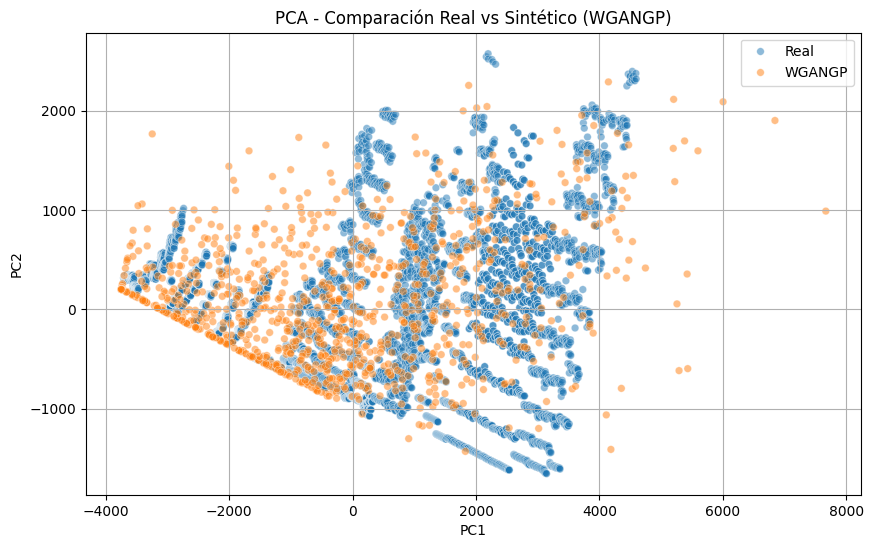

✔️ Varianza explicada por PC1 + PC2: 99.90%


In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Etiquetar el origen de los datos
df_real = df_ruido.copy()
df_real['origen'] = 'Real'

df_sint = df_sintetico_wgangp.copy()
df_sint['origen'] = 'WGANGP'

# Combinar
df_pca_input = pd.concat([df_real, df_sint], ignore_index=True)

# Seleccionar solo columnas numéricas
X = df_pca_input.select_dtypes(include=[np.number]).drop(columns=['origen'], errors='ignore')

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Armar DataFrame con resultados
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['origen'] = df_pca_input['origen'].values

# Gráfico
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='origen', alpha=0.5, s=30)
plt.title('PCA - Comparación Real vs Sintético (WGANGP)')
plt.grid(True)
plt.legend()
plt.show()

# Varianza explicada
print(f"✔️ Varianza explicada por PC1 + PC2: {pca.explained_variance_ratio_.sum():.2%}")

WGAN-GP Embedding por semana

In [ ]:
# PASO 1: Librerías
!pip install -q torch torchvision
from google.colab import drive
drive.mount('/content/drive')

import torch
import torch.nn as nn
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from torch.autograd import grad

# PASO 2: Leer datos
ruta_ruido = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_ruido.xlsx"
df_ruido = pd.read_excel(ruta_ruido)

# Asegurar tipo entero en Semana
df_ruido['Semana'] = df_ruido['Semana'].astype(int)
n_semanas = df_ruido['Semana'].nunique()

# Columnas numéricas
cols_objetivo = df_ruido.select_dtypes(include=[np.number]).columns.tolist()
df_focus = df_ruido[cols_objetivo].dropna().reset_index(drop=True)

# Escalado
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(df_focus)
data_tensor = torch.tensor(data_scaled, dtype=torch.float32)
semana_tensor = torch.tensor(df_focus['Semana'].values[:len(data_tensor)], dtype=torch.long)

# Dimensiones
input_dim = data_tensor.shape[1]
latent_dim = 10

# PASO 3: Generator con embedding por semana
class Generator(nn.Module):
    def __init__(self, n_semanas, embedding_dim=4):
        super().__init__()
        self.embedding = nn.Embedding(n_semanas + 1, embedding_dim)
        self.model = nn.Sequential(
            nn.Linear(latent_dim + embedding_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Linear(128, input_dim)
        )

    def forward(self, z, semana):
        emb = self.embedding(semana)
        x = torch.cat([z, emb], dim=1)
        return self.model(x)

# PASO 4: Crítico y penalización de gradiente
class Critic(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        return self.model(x)

def gradient_penalty(critic, real_data, fake_data):
    alpha = torch.rand(real_data.size(0), 1)
    alpha = alpha.expand_as(real_data)
    interpolated = alpha * real_data + (1 - alpha) * fake_data
    interpolated.requires_grad_(True)

    prob_interpolated = critic(interpolated)
    gradients = grad(
        outputs=prob_interpolated,
        inputs=interpolated,
        grad_outputs=torch.ones_like(prob_interpolated),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]
    gradients = gradients.view(real_data.size(0), -1)
    penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return penalty

# PASO 5: Entrenamiento
generator = Generator(n_semanas=n_semanas)
critic = Critic()

g_optimizer = torch.optim.Adam(generator.parameters(), lr=1e-4, betas=(0.5, 0.9))
c_optimizer = torch.optim.Adam(critic.parameters(), lr=1e-4, betas=(0.5, 0.9))

epochs = 2000
batch_size = 64
lambda_gp = 10
n_critic = 5

for epoch in range(epochs):
    for _ in range(n_critic):
        idx = torch.randint(0, len(data_tensor), (batch_size,))
        real_data = data_tensor[idx]
        semana_batch = semana_tensor[idx]
        z = torch.randn(batch_size, latent_dim)
        fake_data = generator(z, semana_batch).detach()

        critic_real = critic(real_data)
        critic_fake = critic(fake_data)
        gp = gradient_penalty(critic, real_data, fake_data)
        c_loss = -(critic_real.mean() - critic_fake.mean()) + lambda_gp * gp

        c_optimizer.zero_grad()
        c_loss.backward()
        c_optimizer.step()

    z = torch.randn(batch_size, latent_dim)
    semana_batch = semana_tensor[torch.randint(0, len(semana_tensor), (batch_size,))]
    fake_data = generator(z, semana_batch)
    g_loss = -critic(fake_data).mean()

    g_optimizer.zero_grad()
    g_loss.backward()
    g_optimizer.step()

    if epoch % 500 == 0:
        print(f"Epoch {epoch} | Critic Loss: {c_loss.item():.4f} | Generator Loss: {g_loss.item():.4f}")

# PASO 6: Generar datos para todas las semanas (1 a 16)
synthetic_dfs = []
for semana in range(1, 17):
    semana_idx = torch.tensor([semana] * 1000, dtype=torch.long)
    z = torch.randn(1000, latent_dim)
    fake_samples = generator(z, semana_idx).detach().numpy()
    fake_samples = scaler.inverse_transform(fake_samples)
    fake_samples = np.clip(fake_samples, a_min=0, a_max=None)
    df_sintetico = pd.DataFrame(fake_samples, columns=cols_objetivo)
    df_sintetico['Semana'] = semana
    synthetic_dfs.append(df_sintetico)

# Concatenar todos los resultados
df_sintetico_todas = pd.concat(synthetic_dfs, ignore_index=True)

# Guardar
ruta = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_sintetico_todas_semanas.xlsx"
df_sintetico_todas.to_excel(ruta, index=False)
print(f"✅ Datos sintéticos por semana 1 a 16 guardados en: {ruta}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Epoch 0 | Critic Loss: 8.4731 | Generator Loss: 0.0962
Epoch 500 | Critic Loss: -0.0828 | Generator Loss: 1.2139
Epoch 1000 | Critic Loss: -0.0472 | Generator Loss: 1.0934
Epoch 1500 | Critic Loss: -0.0107 | Generator Loss: 0.9953
✅ Datos sintéticos por semana 1 a 16 guardados en: /content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_sintetico_todas_semanas.xlsx


:Comparación variable por variable entre datos reales y sintéticos wgangp

✅ Comparación completada.


,Variable,KS_Statistic,P_Value,Same_Distribution
16,FCAsem,0.524727,2.604788e-224,False
25,TC_porcentaje_,0.464513,2.413728e-173,False
17,FCAacu,0.426219,7.359687e-145,False
26,ROI,0.410053,1.055951e-133,False
24,TA_porcentaje_,0.330212,9.534360e-86,False
12,sobrevivencia_limpia,0.261000,2.771937e-53,False
14,PesoInicial,0.219650,1.018387e-37,False
1,O2_am,0.189750,3.397220e-28,False
3,T_am,0.182630,3.869568e-26,False
21,CAacum,0.149000,1.642813e-17,False


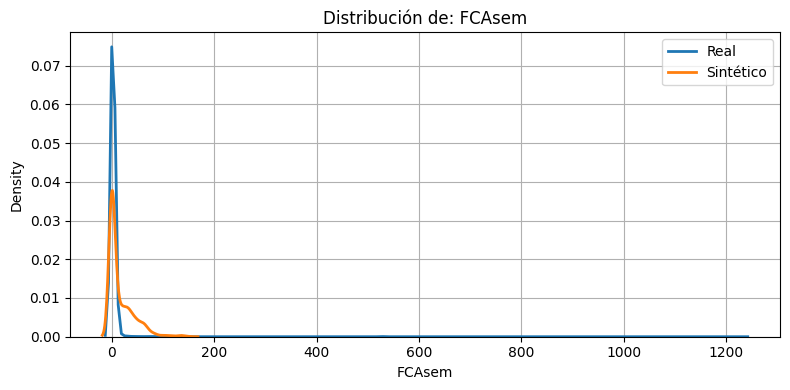

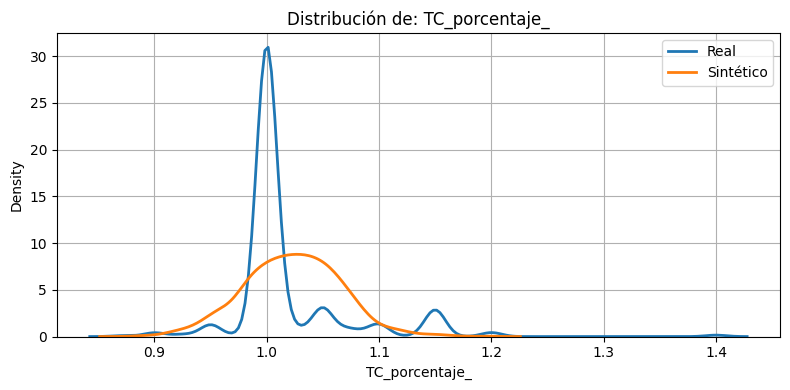

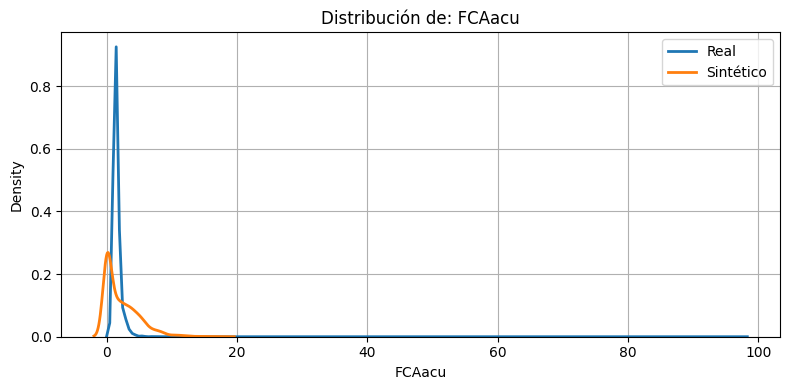

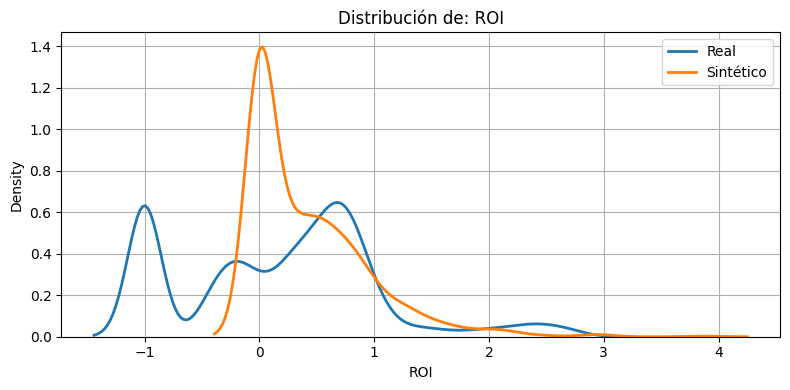

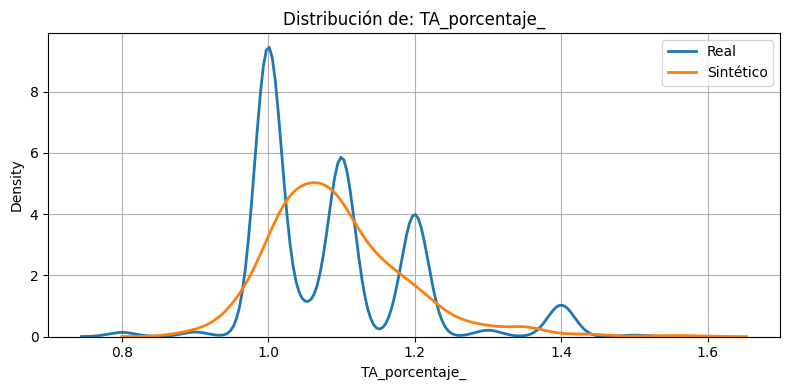

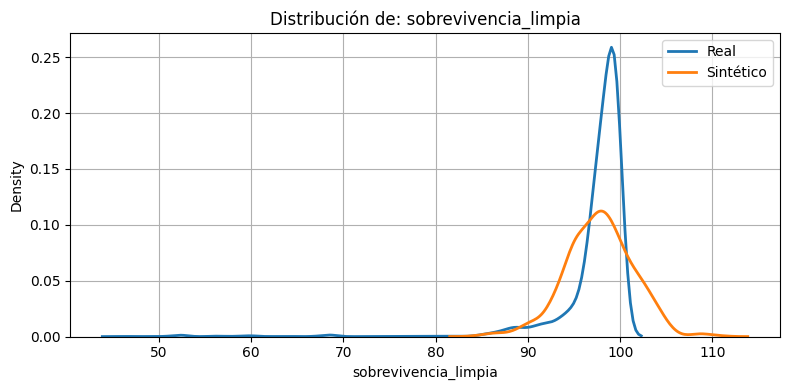

In [ ]:
from scipy.stats import ks_2samp
import seaborn as sns
import matplotlib.pyplot as plt

# ===============================
# Comparar distribuciones variable por variable
# ===============================
ks_resultados = []

for col in cols_objetivo:
    real_vals = df_ruido[col].dropna()
    sint_vals = df_sintetico_wgangp[col].dropna()

    # KS Test
    ks_stat, ks_pval = ks_2samp(real_vals, sint_vals)

    # Guardar resultados
    ks_resultados.append({
        'Variable': col,
        'KS_Statistic': ks_stat,
        'P_Value': ks_pval,
        'Same_Distribution': ks_pval > 0.05
    })

# Crear DataFrame de resultados
df_ks = pd.DataFrame(ks_resultados).sort_values(by='KS_Statistic', ascending=False)
print("✅ Comparación completada.")
display(df_ks)

# ===============================
# Visualizar distribuciones de las 6 variables con mayor diferencia
# ===============================
top_dif = df_ks.head(6)['Variable'].tolist()

for var in top_dif:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(df_ruido[var], label='Real', linewidth=2)
    sns.kdeplot(df_sintetico_wgangp[var], label='Sintético', linewidth=2)
    plt.title(f'Distribución de: {var}')
    plt.xlabel(var)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


Script completo de comparación

In [ ]:
from scipy.stats import ks_2samp
import pandas as pd

# Diccionario con tus modelos
modelos_sinteticos = {
    "GAN": df_sintetico_gan,
    "WGAN": df_sintetico_wgan,
    "WGAN-GP": df_sintetico_wgangp,
    "WGAN-GP-embedding": df_sintetico_todas
}

# Selección de columnas comunes con df_ruido
cols_comunes = df_ruido.select_dtypes(include=[float, int]).columns.intersection(
    set.intersection(*[set(df.columns) for df in modelos_sinteticos.values()])
).tolist()

# Comparación KS por variable y modelo
resultados = []
for modelo, df_sint in modelos_sinteticos.items():
    for col in cols_comunes:
        real = df_ruido[col].dropna()
        sint = df_sint[col].dropna()
        ks_stat, p_val = ks_2samp(real, sint)
        resultados.append({
            "Modelo": modelo,
            "Variable": col,
            "KS_Statistic": ks_stat,
            "P_Value": p_val,
            "Same_Distribution": p_val > 0.05
        })

# Crear DataFrame de resultados
df_ks = pd.DataFrame(resultados)

# Resumen general por modelo
df_resumen = df_ks.groupby("Modelo").agg({
    "KS_Statistic": "mean",
    "Same_Distribution": "mean"
}).rename(columns={
    "KS_Statistic": "KS_Stat_Medio",
    "Same_Distribution": "% Variables Similares"
}).sort_values("KS_Stat_Medio")

print("📊 Resumen KS por Modelo:")
print(df_resumen)



📊 Resumen KS por Modelo:
                   KS_Stat_Medio  % Variables Similares
Modelo                                                 
WGAN-GP                 0.176704                    0.0
WGAN                    0.186084                    0.0
WGAN-GP-embedding       0.203944                    0.0
GAN                     0.403319                    0.0


📊 Resumen KS por Modelo:
                   KS_Stat_Medio  % Variables Similares
Modelo                                                 
WGAN-GP                 0.176704                    0.0
WGAN                    0.186084                    0.0
WGAN-GP-embedding       0.203944                    0.0
GAN                     0.403319                    0.0


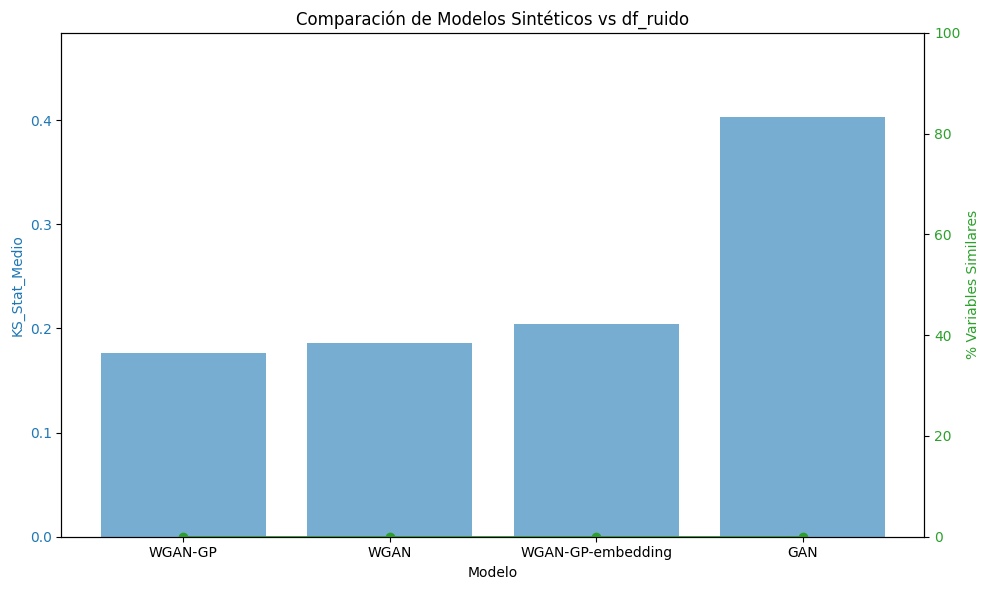

📁 Gráfico guardado en: /content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/KS_comparacion_modelos.png


In [ ]:
import matplotlib.pyplot as plt

# Mostrar resumen en consola
print("📊 Resumen KS por Modelo:")
print(df_resumen)

# Crear gráfico de barras
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:blue'
ax1.set_xlabel('Modelo')
ax1.set_ylabel('KS_Stat_Medio', color=color)
ax1.bar(df_resumen.index, df_resumen['KS_Stat_Medio'], color=color, alpha=0.6, label='KS_Stat_Medio')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_ylim(0, df_resumen['KS_Stat_Medio'].max() * 1.2)

# Crear segundo eje para el % de variables similares
ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('% Variables Similares', color=color)
ax2.plot(df_resumen.index, df_resumen['% Variables Similares'] * 100, color=color, marker='o', linewidth=2, label='% Variables Similares')
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(0, 100)

plt.title('Comparación de Modelos Sintéticos vs df_ruido')
fig.tight_layout()

# Guardar el gráfico
ruta_plot = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/KS_comparacion_modelos.png"
plt.savefig(ruta_plot)
plt.show()

print("📁 Gráfico guardado en:", ruta_plot)


##Aprendizaje por reforzamiento usando Q-Learning (df_ruido)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import KBinsDiscretizer

df_imputado = df_ruido.copy()

# === 1. Definir columnas de estado
cols_estado = [
    'Semana',
    'O2_am', 'pH_am', 'T_am',
    'ph', 'humedad', 'proteina_dumas', 'fibra','fosfolipidos', 'grasa', 'tyr',
    'FCAsem','FCAacu','GPsem', 'GPacu','CAsem', 'CAacum',
     'IC',
    'AlimentoReal_kg_', 'Biomasa_kg_',
    'PesoInicial','Pesodemuestreo_g_','sobrevivencia_limpia',
    'TA_porcentaje_','TC_porcentaje_',
    'ConsumoAlimento_g_cam_dia_',
    'ROI'
]


# === 2. Cargar esas columnas + acción + recompensa
df_rl = df_imputado[cols_estado + ['TA_porcentaje_', 'ROI']].copy()

# === 3. Discretizar estados
est = KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='uniform')
df_rl[cols_estado] = est.fit_transform(df_rl[cols_estado])

# === 4. Convertir columnas discretizadas a enteros
df_rl[cols_estado] = df_rl[cols_estado].astype(int)

# === 5. Generar representación del estado como string
states = df_rl[cols_estado].astype(str).agg('_'.join, axis=1)

# === 6. Definir acciones (tasa alimentación)
df_rl['TA_redondeado'] = df_rl['TA_porcentaje_'].round(1)
actions = sorted(df_rl['TA_redondeado'].unique())

# === 7. Crear Q-table vacía con float
q_table = pd.DataFrame(0.0, index=states.unique(), columns=actions)

# === 8. Parámetros
alpha = 0.1
gamma = 0.9

# === 9. Entrenamiento Q-learning
for idx in range(len(df_rl) - 1):
    s = states.iloc[idx]
    a = df_rl['TA_redondeado'].iloc[idx]
    r = df_rl['ROI'].iloc[idx]  # Puedes cambiar a 'IC' si quieres otra recompensa
    s_next = states.iloc[idx + 1]

    if s_next not in q_table.index:
        q_table.loc[s_next] = [0.0] * len(actions)

    q_table.loc[s, a] = float(q_table.loc[s, a] + alpha * (r + gamma * q_table.loc[s_next].max() - q_table.loc[s, a]))

# === 10. Resultado
q_table_final = q_table.round(3)
q_table_final.head(10)



Intento QLearning

In [ ]:
#preparando el entorno
import numpy as np
import pandas as pd
from collections import defaultdict
import random

df = df_ruido.copy()

# === Discretización de estado ===
df['Semana'] = df['Semana'].astype(int)
df['T_am_bin'] = pd.cut(df['T_am'], bins=[19, 24, 28, 34], labels=[0, 1, 2]).astype(float)
df['O2_am_bin'] = pd.cut(df['O2_am'], bins=[0, 3, 5, 9], labels=[0, 1, 2]).astype(float)
df['pH_am_bin'] = pd.cut(df['pH_am'], bins=[6.5, 7.5, 8.2, 9], labels=[0, 1, 2]).astype(float)
df['ph_bin'] = pd.qcut(df['ph'], q=3, labels=[0, 1, 2]).astype(float)
df['humedad_bin'] = pd.qcut(df['humedad'], q=3, labels=[0, 1, 2]).astype(float)
df['proteina_bin'] = pd.qcut(df['proteina_dumas'], q=3, labels=[0, 1, 2]).astype(float)
df['fibra_bin'] = pd.qcut(df['fibra'], q=3, labels=[0, 1, 2]).astype(float)
df['fosfolipidos_bin'] = pd.qcut(df['fosfolipidos'], q=3, labels=[0, 1, 2]).astype(float)
df['grasa_bin'] = pd.qcut(df['grasa'], q=3, labels=[0, 1, 2]).astype(float)
df['tyr_bin'] = pd.qcut(df['tyr'], q=3, labels=[0, 1, 2]).astype(float)


# === Discretización de acción ===
df['TA_bin'] = pd.cut(df['TA_porcentaje_'], bins=[0, 30, 60, 100], labels=[0, 1, 2]).astype(float)
df['TC_bin'] = pd.cut(df['TC_porcentaje_'], bins=[0, 30, 60, 100], labels=[0, 1, 2]).astype(float)
df['Alimento_bin'] = pd.qcut(df['AlimentoReal_kg_'], q=3, labels=[0, 1, 2]).astype(float)



###Paso 2:Definir estados, acciones y recompensas
# Supón que ya tienes estos discretizados como enteros
states = df[[
    'Semana', 'T_am_bin', 'O2_am_bin', 'pH_am_bin',
    'ph_bin', 'humedad_bin', 'proteina_bin', 'fibra_bin',
    'fosfolipidos_bin', 'grasa_bin', 'tyr_bin'
]].apply(tuple, axis=1).unique()


actions = df[['TA_bin', 'TC_bin', 'Alimento_bin']].apply(tuple, axis=1).unique()

# Crear un diccionario de recompensas: Estado -> Acción -> Recompensa
reward_table = defaultdict(lambda: defaultdict(float))

for _, row in df.iterrows():
    estado = (row['Semana'], row['T_am'], row['O2_am'], row['pH_am'])
    accion = (row['TA_bin'], row['TC_bin'], row['Alimento_bin'])

    ic = row['IC'] if not np.isnan(row['IC']) else 0
    roi = row['ROI'] if not np.isnan(row['ROI']) else 0
    sobrev = row['sobrevivencia_limpia'] if not np.isnan(row['sobrevivencia_limpia']) else 0

    recompensa = 0.4 * roi + 0.3 * ic + 0.3 * (sobrev / 100)  # normalizado
    reward_table[estado][accion] = recompensa


###Paso 3: Q-learning
Q = defaultdict(lambda: defaultdict(float))
alpha = 0.1
gamma = 0.9
epsilon = 0.2
episodes = 10000

state_list = list(states)
action_list = list(actions)

for ep in range(episodes):
    estado = random.choice(state_list)

    for _ in range(10):
        if np.random.rand() < epsilon:
            accion = random.choice(action_list)
        else:
            accion = max(Q[estado], key=Q[estado].get, default=random.choice(action_list))

        recompensa = reward_table[estado][accion]
        proximo_estado = estado  # sin transición (modelo basado en política estática)

        max_q_next = max(Q[proximo_estado].values(), default=0)
        Q[estado][accion] += alpha * (recompensa + gamma * max_q_next - Q[estado][accion])


###Paso 4: Política final
policy = {estado: max(Q[estado], key=Q[estado].get) for estado in Q}
policy_df = pd.DataFrame([
    {'Estado': estado, 'TA_bin': a[0], 'TC_bin': a[1], 'Alimento_bin': a[2]}
    for estado, a in policy.items()
])

import json
import pandas as pd

ruta_base = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13"

# ✅ Convertimos Q a formato serializable: clave → str, valor → dict con claves str
Q_serializable = {
    str(state): {str(action): float(value) for action, value in actions.items()}
    for state, actions in Q.items()
}

# ✅ Guardamos Q como JSON
with open(f"{ruta_base}/q_table_optima.json", "w") as f:
    json.dump(Q_serializable, f)

# ✅ Convertimos policy a CSV-friendly
policy_df = pd.DataFrame([
    {
        'Estado': str(state),
        'TA_bin': int(action[0]),
        'TC_bin': int(action[1]),
        'Alimento_bin': int(action[2])
    }
    for state, action in policy.items()
])

# ✅ Guardamos la política como CSV
policy_df.to_csv(f"{ruta_base}/policy_optima.csv", index=False)

print("✅ Política y Q_table guardadas correctamente como JSON y CSV.")



###POLITICA LEGIBLE

In [ ]:
import numpy as np
import pandas as pd

# Cargar el archivo df_ruido.xlsx
file_path = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_ruido.xlsx"
df_ruido = pd.read_excel(file_path)

# Variables de interés para reconstruir rangos reales
variables_interes = [
    'fibra', 'fosfolipidos',  'grasa', 'humedad', 'proteina_dumas','tyr',
     'O2_am', 'T_am', 'pH_am','ph',
    'TA_porcentaje_','TC_porcentaje_'
]

# Calcular el rango real de cada variable en df_ruido
rangos_reales = df_ruido[variables_interes].agg(['min', 'max'])

# Simulación de df_q: tabla óptima con variables discretizadas
# Para esta demo, discretizamos df_ruido por bins=10 como ejemplo
df_q = df_ruido.copy()
bins = 10
for col in variables_interes:
    df_q[col] = pd.qcut(df_q[col], q=bins, labels=False, duplicates='drop')

# Agrupar para obtener combinaciones únicas y calcular medias
df_rangos = df_q.groupby(variables_interes).agg({'IC': 'mean', 'ROI': 'mean', 'Semana': 'mean', 'sobrevivencia_limpia': 'mean'}).reset_index()

# Asociar cada valor discreto a su rango real
df_rangos_rangos = pd.DataFrame()
for col in variables_interes:
    min_val = rangos_reales.loc['min', col]
    max_val = rangos_reales.loc['max', col]
    bin_size = (max_val - min_val) / bins

    df_rangos_rangos[f'{col}_min_real'] = df_rangos[col].apply(lambda x: round(min_val + x * bin_size, 3))
    df_rangos_rangos[f'{col}_max_real'] = df_rangos[col].apply(lambda x: round(min_val + (x + 1) * bin_size, 3))

# Combinar con los valores originales
df_resultado = pd.concat([df_rangos, df_rangos_rangos], axis=1)


# Guardar CSV final con etiquetas traducidas
ruta_final = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/policy_optima_traducida.csv"
df_resultado.to_csv(ruta_final, index=False)

ruta_final
df_resultado.head()


,fibra,fosfolipidos,grasa,humedad,proteina_dumas,tyr,O2_am,T_am,pH_am,ph,...,T_am_min_real,T_am_max_real,pH_am_min_real,pH_am_max_real,ph_min_real,ph_max_real,TA_porcentaje__min_real,TA_porcentaje__max_real,TC_porcentaje__min_real,TC_porcentaje__max_real
0,0,0,4,9,8,8,7,0,2,5,...,23.70,24.68,7.538,7.682,7.272,7.564,0.94,1.01,0.87,0.923
1,0,0,5,9,6,8,4,6,9,5,...,29.58,30.56,8.546,8.690,7.272,7.564,0.94,1.01,0.87,0.923
2,0,0,5,9,6,8,8,0,3,4,...,23.70,24.68,7.682,7.826,6.981,7.272,0.94,1.01,0.87,0.923
3,0,0,5,9,7,8,1,4,0,4,...,27.62,28.60,7.250,7.394,6.981,7.272,1.01,1.08,0.87,0.923
4,0,0,5,9,7,8,2,4,0,4,...,27.62,28.60,7.250,7.394,6.981,7.272,0.94,1.01,0.87,0.923


politica legible df_policy


In [ ]:
import pandas as pd
import numpy as np

# Ruta
ruta_policy = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/policy_optima.csv"
df_policy = pd.read_csv(ruta_policy)

# Descomponer 'Estado' en columnas individuales
estado_cols = ['Semana', 'T_am_bin', 'O2_am_bin', 'pH_am_bin', 'ph_bin',
               'humedad_bin', 'proteina_bin', 'fibra_bin', 'fosfolipidos_bin',
               'grasa_bin', 'tyr_bin']

df_policy[estado_cols] = df_policy['Estado'].str.strip('()') \
    .str.split(',', expand=True) \
    .apply(lambda col: col.str.strip()).astype(float).astype(int)

# Cargar df_ruido original para obtener los rangos reales
df_ruido = pd.read_excel("/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/df_ruido.xlsx")

# Variables numéricas discretizadas
variables_discretizadas = {
    'T_am_bin': 'T_am',
    'O2_am_bin': 'O2_am',
    'pH_am_bin': 'pH_am',
    'ph_bin': 'ph',
    'humedad_bin': 'humedad',
    'proteina_bin': 'proteina_dumas',
    'fibra_bin': 'fibra',
    'fosfolipidos_bin': 'fosfolipidos',
    'grasa_bin': 'grasa',
    'tyr_bin': 'tyr'
}

# Calcular los rangos reales para cada bin
bin_labels = [0, 1, 2]
bin_ranges = {}

for bin_col, real_col in variables_discretizadas.items():
    bins = pd.qcut(df_ruido[real_col], q=3, labels=bin_labels, duplicates='drop', retbins=True)[1]
    bin_ranges[bin_col] = [(round(bins[i], 2), round(bins[i+1], 2)) for i in range(len(bins)-1)]

# Función para convertir valor a rango string
def valor_a_rango(val, var):
    r_min, r_max = bin_ranges[var][val]
    return f"[{r_min}; {r_max})"  # 👉 Separador cambiado a punto y coma

# Aplicar traducción
for var in variables_discretizadas.keys():
    df_policy[f'{var}_rango'] = df_policy[var].apply(lambda x: valor_a_rango(x, var))

# Mantener solo columnas deseadas
cols_finales = ['Semana', 'TA_bin', 'TC_bin', 'Alimento_bin'] + [f'{var}_rango' for var in variables_discretizadas.keys()]
df_rangos_policy = df_policy[cols_finales]

# Guardar con separador ;
#ruta_salida = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/policy_optima_con_rangos.csv"
#df_rangos_policy.to_csv(ruta_salida, index=False, sep=";")
#print("✅ Política con rangos guardada con separador ';' en:", ruta_salida)

# === Agregar rangos para las acciones ===

# Definir los bins usados para discretización original
bins_ta_tc = [0, 30, 60, 100]
bins_alimento = pd.qcut(df_ruido['AlimentoReal_kg_'], q=3, retbins=True, duplicates='drop')[1]

# Funciones de traducción
def traducir_bin_ta_tc(val):
    val = int(val)
    return f"[{bins_ta_tc[val]}; {bins_ta_tc[val+1]})"

def traducir_bin_alimento(val):
    val = int(val)
    return f"[{round(bins_alimento[val], 2)}; {round(bins_alimento[val+1], 2)})"

# Agregar columnas traducidas
df_rangos_policy['TA_bin_rango'] = df_rangos_policy['TA_bin'].astype(float).astype(int).apply(traducir_bin_ta_tc)
df_rangos_policy['TC_bin_rango'] = df_rangos_policy['TC_bin'].astype(float).astype(int).apply(traducir_bin_ta_tc)
df_rangos_policy['Alimento_bin_rango'] = df_rangos_policy['Alimento_bin'].astype(float).astype(int).apply(traducir_bin_alimento)


# Reordenar columnas para exportar con rangos
cols_finales_completas = ['Semana', 'TA_bin_rango', 'TC_bin_rango', 'Alimento_bin_rango'] + \
                         [f'{var}_rango' for var in variables_discretizadas.keys()]

# Guardar con separador ;
ruta_salida_final = "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/policy_completa_con_rangos.csv"
df_rangos_policy[cols_finales_completas].to_csv(ruta_salida_final, index=False, sep=";")

print("✅ Política final con todos los rangos (acciones y estado) guardada en:", ruta_salida_final)




✅ Política final con todos los rangos (acciones y estado) guardada en: /content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/policy_completa_con_rangos.csv


/tmp/ipython-input-167-553334715.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rangos_policy['TA_bin_rango'] = df_rangos_policy['TA_bin'].astype(float).astype(int).apply(traducir_bin_ta_tc)
/tmp/ipython-input-167-553334715.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rangos_policy['TC_bin_rango'] = df_rangos_policy['TC_bin'].astype(float).astype(int).apply(traducir_bin_ta_tc)
/tmp/ipython-input-167-553334715.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

Ejecutar Streamlit desde Colab con workaround (no recomendado para producción)

In [ ]:
!ngrok config add-authtoken 30JCxaVg6nNTJyOnpNzMcXOS50B_4ua5Ffoc8oYWjdwyHRWGn


Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


In [ ]:
!python "/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/simulador.py"


2025-07-24 06:40:05.760 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-07-24 06:40:05.817 
  command:

    streamlit run /content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/simulador.py [ARGUMENTS]
2025-07-24 06:40:05.817 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-07-24 06:40:05.817 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-07-24 06:40:05.817 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-07-24 06:40:05.817 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-07-24 06:40:05.817 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-07-24 06:40:05.817 T

In [ ]:
# Paso 1: Instalar si no está instalado
!pip install streamlit pyngrok --quiet

# Paso 2: Importar y abrir túnel NGROK en el puerto 8501
from pyngrok import ngrok
public_url = ngrok.connect(8501)
print(f"🌐 Tu app estará disponible en: {public_url}")

# Paso 3: Ejecutar Streamlit (en segundo plano)
!streamlit run '/content/drive/MyDrive/UNI/tercer ciclo/2.Proyecto_investigacion/Clase_13/simulador.py' &


🌐 Tu app estará disponible en: NgrokTunnel: "https://5daf828aa0b6.ngrok-free.app" -> "http://localhost:8501"



  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://34.87.58.83:8501

────────────────────────── Traceback (most recent call last) ───────────────────────────
  /usr/local/lib/python3.11/dist-packages/pandas/core/indexes/base.py:3805 in get_loc   
                                                                                        
    3802 │   │   """                                                                    
    3803 │   │   casted_key = self._maybe_cast_indexer(key)                             
    3804 │   │   try:                                                                   
  ❱ 3805 │   │   │   return self._engine.get_loc(casted_key)                            
    3806 │   │   except KeyError as err:                                                
    3

Intento v2


In [ ]:
import numpy as np
import pandas as pd
import random

df = df_ruido.copy()

# === Discretización de estado ===
df['Semana'] = df['Semana'].astype(float)
df['T_am_bin'] = pd.cut(df['T_am'], bins=[19, 24, 28, 34], labels=[0, 1, 2]).astype(float)
df['O2_am_bin'] = pd.cut(df['O2_am'], bins=[0, 3, 5, 9], labels=[0, 1, 2]).astype(float)
df['pH_am_bin'] = pd.cut(df['pH_am'], bins=[6.5, 7.5, 8.2, 9], labels=[0, 1, 2]).astype(float)

df['state'] = df.apply(lambda row: str((
    float(row['Semana']),
    float(row['T_am_bin']),
    float(row['O2_am_bin']),
    float(row['pH_am_bin'])
)), axis=1)

# === Discretización de acción ===
df['TA_bin'] = pd.cut(df['TA_porcentaje_'], bins=[0, 30, 60, 100], labels=[0, 1, 2]).astype(float)
df['TC_bin'] = pd.cut(df['TC_porcentaje_'], bins=[0, 30, 60, 100], labels=[0, 1, 2]).astype(float)
df['Alimento_bin'] = pd.qcut(df['AlimentoReal_kg_'], q=3, labels=[0, 1, 2]).astype(float)

df['action'] = df.apply(lambda row: str((
    float(row['TA_bin']),
    float(row['TC_bin']),
    float(row['Alimento_bin'])
)), axis=1)

# === Recompensa ===
df['IC_norm'] = (df['IC'] - df['IC'].min()) / (df['IC'].max() - df['IC'].min())
df['ROI_norm'] = (df['ROI'] - df['ROI'].min()) / (df['ROI'].max() - df['ROI'].min())
df['surv_norm'] = df['sobrevivencia_limpia'] / 100
df['FCA_norm'] = (df['FCAsem'] - df['FCAsem'].min()) / (df['FCAsem'].max() - df['FCAsem'].min())

df['reward'] = (
    4 * df['ROI_norm'] +
    4 * df['IC_norm'] +
    3 * df['surv_norm'] -
    2 * df['FCA_norm']
)

# === Q-table como DataFrame con strings ===
states = df['state'].dropna().unique().tolist()
actions = df['action'].dropna().unique().tolist()
Q_table = pd.DataFrame(0.0, index=states, columns=actions)

# === Q-learning ===
alpha = 0.1
gamma = 0.95
epsilon = max(0.1, 0.4 * (0.995 ** ep))  # empieza en 0.4 y baja lentamente a 0.1
episodes = 20000

for ep in range(episodes):
    row = df.sample(1).iloc[0]
    s = row['state']
    a = row['action']
    r = row['reward']

    if pd.isna(s) or pd.isna(a): continue
    if s in Q_table.index and a in Q_table.columns:
        current_q = Q_table.loc[s, a]
        max_future_q = Q_table.loc[s].max()
        Q_table.loc[s, a] = current_q + alpha * (r + gamma * max_future_q - current_q)

# === Política aprendida ===
policy = Q_table.idxmax(axis=1).reset_index()
policy.columns = ['Estado (Semana, T_am, O2_am, pH_am)', 'Mejor acción (TA, TC, AlimentoReal_bin)']
print("✅ Política aprendida (primeras filas):")
print(policy.head())




✅ Política aprendida (primeras filas):
  Estado (Semana, T_am, O2_am, pH_am) Mejor acción (TA, TC, AlimentoReal_bin)
0                (5.0, 1.0, 2.0, 1.0)                         (0.0, 0.0, 0.0)
1                (4.0, 1.0, 2.0, 1.0)                         (0.0, 0.0, 0.0)
2                (2.0, 1.0, 2.0, 1.0)                         (0.0, 0.0, 0.0)
3                (6.0, 1.0, 2.0, 1.0)                         (0.0, 0.0, 0.0)
4                (6.0, 1.0, 1.0, 1.0)                         (0.0, 0.0, 0.0)


visualizacion la politica

In [ ]:
import ast  # para convertir string -> tupla

# Convierte las cadenas a tuplas reales
policy['Estado (Semana, T_am, O2_am, pH_am)'] = policy['Estado (Semana, T_am, O2_am, pH_am)'].apply(ast.literal_eval)
policy['Mejor acción (TA, TC, AlimentoReal_bin)'] = policy['Mejor acción (TA, TC, AlimentoReal_bin)'].apply(ast.literal_eval)



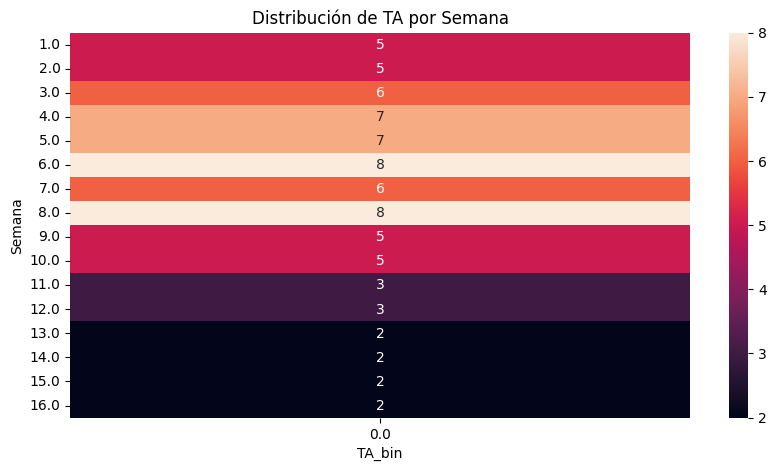

In [ ]:
policy[['Semana', 'T_am', 'O2_am', 'pH_am']] = pd.DataFrame(policy['Estado (Semana, T_am, O2_am, pH_am)'].tolist(), index=policy.index)
policy[['TA_bin', 'TC_bin', 'Alimento_bin']] = pd.DataFrame(policy['Mejor acción (TA, TC, AlimentoReal_bin)'].tolist(), index=policy.index)

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 5))
sns.heatmap(pd.crosstab(policy['Semana'], policy['TA_bin']), annot=True, fmt='d')
plt.title("Distribución de TA por Semana")
plt.show()


Heatmap de TC_bin por semana

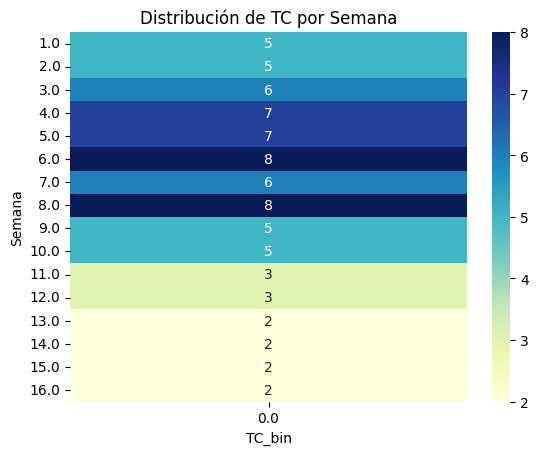

In [ ]:
# Heatmap de frecuencia de TC_bin por semana
tc_heatmap = policy.groupby(['Semana', 'TC_bin']).size().unstack(fill_value=0)
sns.heatmap(tc_heatmap, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Distribución de TC por Semana")
plt.show()


Heatmap de Alimento_bin por semana

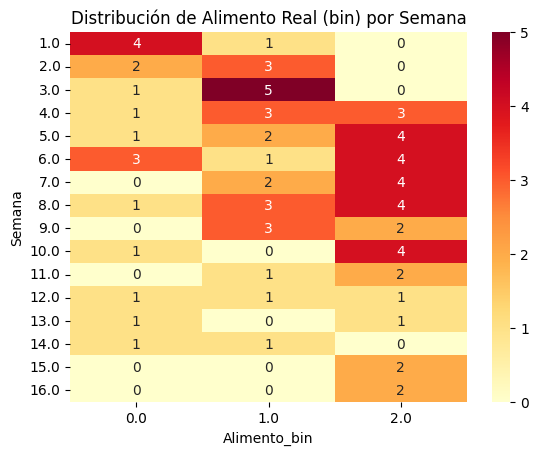

In [ ]:
# Heatmap de frecuencia de Alimento_bin por semana
alimento_heatmap = policy.groupby(['Semana', 'Alimento_bin']).size().unstack(fill_value=0)
sns.heatmap(alimento_heatmap, annot=True, fmt="d", cmap="YlOrRd")
plt.title("Distribución de Alimento Real (bin) por Semana")
plt.show()


Convertir TA_bin, TC_bin, Alimento_bin a valores reales

In [ ]:
# Define los valores reales de cada acción binaria
ta_valores = df_ruido['TA_porcentaje_'].dropna().unique()
tc_valores = df_ruido['TC_porcentaje_'].dropna().unique()
alimento_valores = df_ruido['AlimentoReal_kg_'].dropna().unique()

# Aseguramos orden para el mapeo binario
ta_valores = sorted(ta_valores)
tc_valores = sorted(tc_valores)
alimento_valores = sorted(alimento_valores)

# Crear columnas reales en policy
policy['TA'] = policy['TA_bin'].apply(lambda x: ta_valores[int(x)])
policy['TC'] = policy['TC_bin'].apply(lambda x: tc_valores[int(x)])
policy['AlimentoReal_kg_'] = policy['Alimento_bin'].apply(lambda x: alimento_valores[int(x)])

####Unir policy con df_ruido usando condiciones
# Redondear decimales para merge
df_ruido_copy = df_ruido.copy()
df_ruido_copy['merge_key'] = list(zip(
    df_ruido_copy['Semana'].astype(float),
    df_ruido_copy['T_am'].astype(float),
    df_ruido_copy['O2_am'].astype(float),
    df_ruido_copy['pH_am'].astype(float),
    df_ruido_copy['TA_porcentaje_'].astype(float),
    df_ruido_copy['TC_porcentaje_'].astype(float),
    df_ruido_copy['AlimentoReal_kg_'].astype(float)
))

policy['merge_key'] = list(zip(
    policy['Semana'], policy['T_am'], policy['O2_am'], policy['pH_am'],
    policy['TA'], policy['TC'], policy['AlimentoReal_kg_']
))

# Hacemos merge para obtener ROI
policy = policy.merge(
    df_ruido_copy[['merge_key', 'ROI']],
    on='merge_key',
    how='left'
)


In [ ]:
# Paso 1: Redondear todas las columnas del estado y acción
def preparar_merge(df):
    return df[['Semana', 'T_am', 'O2_am', 'pH_am']].round(1).astype(float)

policy[['Semana', 'T_am', 'O2_am', 'pH_am']] = preparar_merge(policy)
df_ruido[['Semana', 'T_am', 'O2_am', 'pH_am']] = preparar_merge(df_ruido)

policy['TA'] = policy['TA'].astype(float)
policy['TC'] = policy['TC'].astype(float)
policy['AlimentoReal_kg_'] = policy['AlimentoReal_kg_'].astype(float)

df_ruido['TA_porcentaje_'] = df_ruido['TA_porcentaje_'].astype(float)
df_ruido['TC_porcentaje_'] = df_ruido['TC_porcentaje_'].astype(float)
df_ruido['AlimentoReal_kg_'] = df_ruido['AlimentoReal_kg_'].astype(float)

# Paso 2: Reconstruir la clave de unión
policy['merge_key'] = list(zip(
    policy['Semana'], policy['T_am'], policy['O2_am'], policy['pH_am'],
    policy['TA'], policy['TC'], policy['AlimentoReal_kg_']
))

df_ruido['merge_key'] = list(zip(
    df_ruido['Semana'], df_ruido['T_am'], df_ruido['O2_am'], df_ruido['pH_am'],
    df_ruido['TA_porcentaje_'], df_ruido['TC_porcentaje_'], df_ruido['AlimentoReal_kg_']
))

# Paso 3: Hacer el merge
policy = policy.drop(columns=['ROI'], errors='ignore')
policy = policy.merge(df_ruido[['merge_key', 'ROI']], on='merge_key', how='left')


In [ ]:
print(policy['ROI'].isna().sum(), "/", len(policy))  # Esperamos que no sean 76/76


76 / 76


In [ ]:
print("Ejemplo en policy:")
print(policy['merge_key'].drop_duplicates().head())

print("\nEjemplo en df_ruido:")
print(df_ruido['merge_key'].drop_duplicates().head())


Ejemplo en policy:
0    (5.0, 1.0, 2.0, 1.0, 0.8, 0.87, 0.0)
1    (4.0, 1.0, 2.0, 1.0, 0.8, 0.87, 0.0)
2    (2.0, 1.0, 2.0, 1.0, 0.8, 0.87, 0.0)
3    (6.0, 1.0, 2.0, 1.0, 0.8, 0.87, 0.0)
4    (6.0, 1.0, 1.0, 1.0, 0.8, 0.87, 0.0)
Name: merge_key, dtype: object

Ejemplo en df_ruido:
0    (5.0, 27.1, 6.1, 8.0, 1.2, 1.0, 0.004043628740...
1    (5.0, 27.1, 6.2, 8.0, 1.2, 1.0, 0.003688092314...
2    (5.0, 27.1, 6.2, 8.0, 1.2, 1.0, 0.003481994119...
3    (5.0, 27.1, 6.1, 8.0, 1.2, 1.0, 0.003984796645...
4    (5.0, 27.0, 6.1, 8.1, 1.2, 1.0, 0.003616711479...
Name: merge_key, dtype: object


In [ ]:
coinciden = set(policy['merge_key']).intersection(set(df_ruido['merge_key']))
print(f"Número de coincidencias exactas: {len(coinciden)}")


Número de coincidencias exactas: 0


Graficar ROI promedio por TA_bin

In [ ]:
print(df_ruido.columns.tolist())


['Unnamed: 0', 'O2_am', 'pH_am', 'T_am', 'ph', 'humedad', 'proteina_dumas', 'fibra', 'fosfolipidos', 'grasa', 'tyr', 'Semana', 'sobrevivencia_limpia', 'Pesodemuestreo_g_', 'PesoInicial', 'IC', 'FCAsem', 'FCAacu', 'GPsem', 'GPacu', 'CAsem', 'CAacum', 'AlimentoReal_kg_', 'Biomasa_kg_', 'TA_porcentaje_', 'TC_porcentaje_', 'ROI', 'ConsumoAlimento_g_cam_dia_', 'merge_key', 'TA_bin', 'TC_bin', 'Alimento_bin', 'Estado', 'T_am_disc', 'O2_am_disc', 'pH_am_disc']


In [ ]:
print(policy_df['Estado'].dtype)
print(df_ruido['Estado'].dtype)

print(policy_df['Estado'].head())
print(df_ruido['Estado'].head())


object
object
0    (5.0, 1.0, 2.0, 1.0)
1    (4.0, 1.0, 2.0, 1.0)
2    (2.0, 1.0, 2.0, 1.0)
3    (6.0, 1.0, 2.0, 1.0)
4    (6.0, 1.0, 1.0, 1.0)
Name: Estado, dtype: object
0    (5.0, 27.1, 6.1, 8.0)
1    (5.0, 27.1, 6.2, 8.0)
2    (5.0, 27.1, 6.2, 8.0)
3    (5.0, 27.1, 6.1, 8.0)
4    (5.0, 27.0, 6.1, 8.1)
Name: Estado, dtype: object


In [ ]:
print(policy_with_roi.columns.tolist())


['Estado (Semana, T_am, O2_am, pH_am)', 'Mejor acción (TA, TC, AlimentoReal_bin)', 'len_estado', 'Semana', 'T_am', 'O2_am', 'pH_am', 'TA_bin', 'TC_bin', 'Alimento_bin', 'TA', 'TC', 'AlimentoReal_kg_', 'merge_key', 'ROI_x', 'Estado', 'ROI_y']


In [ ]:
policy_with_roi['ROI'] = policy_with_roi['ROI_y']


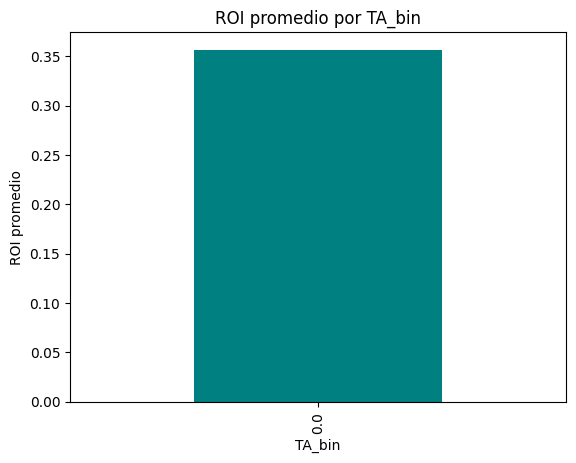

In [ ]:
policy_with_roi.groupby('TA_bin')['ROI'].mean().plot(kind='bar', color='teal')
plt.title("ROI promedio por TA_bin")
plt.xlabel("TA_bin")
plt.ylabel("ROI promedio")
plt.show()


In [ ]:
print(policy_with_roi['TA_bin'].value_counts())


TA_bin
0.0    1889
Name: count, dtype: int64


In [ ]:
print(df_ruido['TA_bin'].value_counts())


TA_bin
0    3296
1    2239
2    1786
Name: count, dtype: int64


Heatmap de Política: Estado vs. Acción

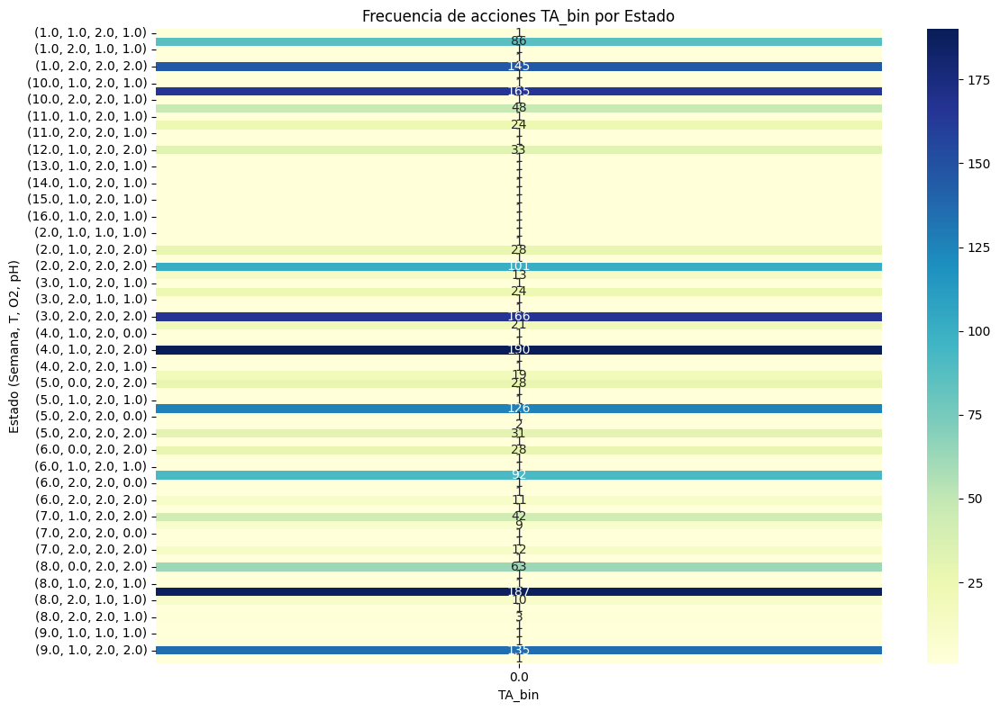

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una representación del estado como string para agrupar
policy_with_roi["Estado_str"] = policy_with_roi["Estado"].astype(str)

# Elegimos una acción para visualizar primero: TA_bin
heatmap_data = policy_with_roi.groupby(["Estado_str", "TA_bin"]).size().unstack(fill_value=0)

# 🔥 Graficar heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, cmap="YlGnBu", fmt="d")
plt.title("Frecuencia de acciones TA_bin por Estado")
plt.ylabel("Estado (Semana, T, O2, pH)")
plt.xlabel("TA_bin")
plt.tight_layout()
plt.show()


ROI promedio por TC_bin y Alimento_bin

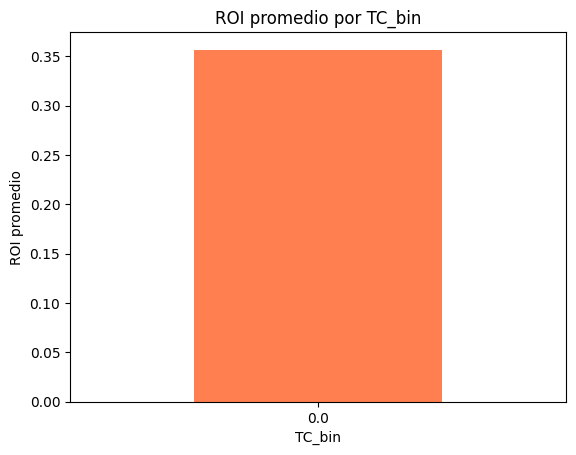

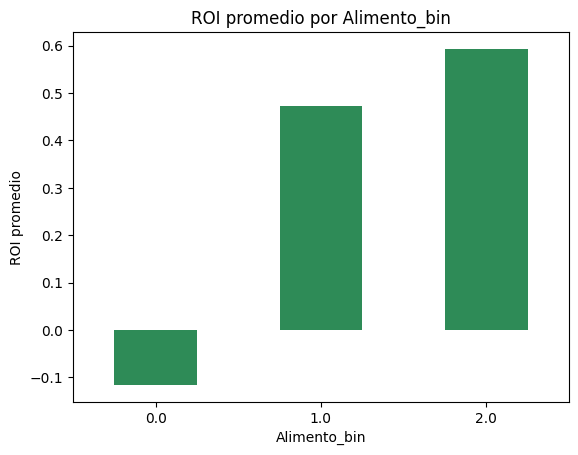

In [ ]:
# ROI promedio por TC_bin
policy_with_roi.groupby('TC_bin')['ROI_y'].mean().plot(kind='bar', color='coral')
plt.title("ROI promedio por TC_bin")
plt.xlabel("TC_bin")
plt.ylabel("ROI promedio")
plt.xticks(rotation=0)
plt.show()

# ROI promedio por Alimento_bin
policy_with_roi.groupby('Alimento_bin')['ROI_y'].mean().plot(kind='bar', color='seagreen')
plt.title("ROI promedio por Alimento_bin")
plt.xlabel("Alimento_bin")
plt.ylabel("ROI promedio")
plt.xticks(rotation=0)
plt.show()


<Axes: xlabel='TA_bin'>

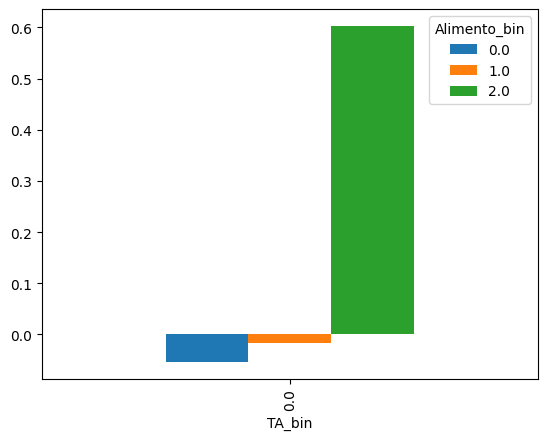

In [ ]:
df.groupby(['TA_bin', 'Alimento_bin'])['ROI'].mean().unstack().plot(kind='bar', stacked=False)
